In [1]:
from pitas import power, flipper_tools
from orphics import maps as omaps
from pixell import enplot, enmap, curvedsky, powspec
import numpy as np
from cosmikyu import stats, mpi, datasets, config, utils, gan, transforms
from cosmikyu import nn as cnn
import os
from itertools import product
import healpy as hp
import matplotlib.pyplot as plt
import random
from itertools import cycle

%matplotlib inline
%load_ext autoreload
%autoreload 2

/home/dwhan89/.miniconda3/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


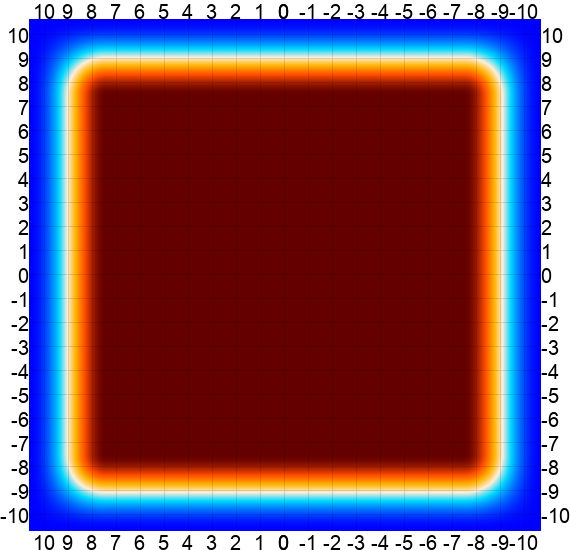

In [2]:
nside = 20
nbatch = nside*nside ## it goes like nbatch**2

shape = (128, 128)
bshape = (128*nside,128*nside)
_, bwcs = omaps.rect_geometry(width_arcmin=64.*nside, px_res_arcmin=0.5)
cuda = False

def get_template(shape, wcs):
    return enmap.zeros(shape, wcs)

def get_mask(taper_percent=15.):
    taper, _ = omaps.get_taper(bshape, bwcs, taper_percent=taper_percent, pad_percent=0.)
    loc = taper == 0
    taper[loc] = np.min(taper[~loc])
    return taper

mask = get_mask()
enplot.pshow(mask, downgrade=5)

In [8]:
lmax=10000
bin_edges = np.linspace(0,lmax, 50)
l = np.arange(lmax+1)
beam_fwhm = 0.9
beam_fwhm = np.deg2rad(beam_fwhm/60.)
sigma     = beam_fwhm/(2.*np.sqrt(2.*np.log(2)))
def get_f_ell(l):
    f_ell = np.exp(-(l)**2.*sigma**2./2)
    return l, f_ell
transfer = list(get_f_ell(l))
PITAS = power.PITAS("151020_{}x{}_0.9deconv".format(bshape[0],bshape[1]), mask, mask, bin_edges=bin_edges, lmax=lmax, transfer=transfer)
#PITAS = power.PITAS("151020_test".format(bshape[0],bshape[1]), mask, mask, bin_edges=bin_edges, lmax=lmax, transfer=transfer, overwrite=True)

/home/dwhan89/.miniconda3/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


mcm directory: /home/dwhan89/workspace/pitas/pitas/../output/151020_2560x2560_0.9deconv
trying to load /home/dwhan89/workspace/pitas/pitas/../output/151020_2560x2560_0.9deconv/curved_full_DLTT_inv.dat
[get_bbl] mcm directory: /home/dwhan89/workspace/pitas/pitas/../output/151020_2560x2560_0.9deconv
trying to load /home/dwhan89/workspace/pitas/pitas/../output/151020_2560x2560_0.9deconv/curved_full_BBL_CLTT.dat
trying to load /home/dwhan89/workspace/pitas/pitas/../output/151020_2560x2560_0.9deconv/curved_full_BBL_DLTT.dat


In [9]:
data_dir = config.default_data_dir
sehgal_dir = os.path.join(data_dir, 'sehgal')
stat_dir = os.path.join(sehgal_dir, "stats")
SDS_test = datasets.SehgalDataSet(sehgal_dir, "test141020", transforms=[], dummy_label=False)

plot_dir = "/home/dwhan89/scratch/outbox/cosmikyu"
def plot_path(x):
    return os.path.join(plot_dir, x)

In [10]:

STAT_TEST = stats.STATS("201020_test_specs_deconv", output_dir=stat_dir, overwrite=False)

def get_data(wcs=bwcs, nside=nside, dataset=SDS_test, taper=True):
    data = SDS_test[0].copy()
    nx, ny = shape
    nshape = (data.shape[0], nx*nside, ny*nside)
    temp = enmap.zeros(nshape, wcs)
    for i in range(nside):
        for j in range(nside):
            cidx = random.randint(0, len(SDS_test)-1)
            sx = i*nx
            sy = j*ny
            temp[:,sy:sy+ny,sx:sx+nx] = SDS_test[cidx][...]
    if taper:
        temp[...] *= get_mask()
    return temp


#lmax = 10000
overwrite = False
compts = ["kappa", "ksz", "tsz", "ir", "rad"]
subtasks = [10,20,30,40,50,60,5,35,45,25]#np.arange(10, dtype=np.int)
for sim_idx in subtasks:
    compts = ["kappa", "ksz", "tsz", "ir", "rad"]
    print("processing sim {}".format(sim_idx))
    if STAT_TEST.has_data("dls_radxrad", sim_idx):
        continue
    emap = get_data()

    alms = {}
    for i, compt_idx in enumerate(compts):
        #print(i, compt_idx)
        alms[compt_idx] = curvedsky.map2alm(emap[i], lmax=lmax)
    del compt_idx

    for compt_idx1, compt_idx2 in product(compts, compts):
        compt_keys = [compt_idx1, compt_idx2]
        compt_keys.sort()
        stat_key = "dls_{}x{}".format(compt_keys[0], compt_keys[1])
        if STAT_TEST.has_data(stat_key, sim_idx):
            continue
        else:
            cl = hp.alm2cl(alms[compt_idx1], alms[compt_idx2])
            l = np.arange(len(cl), dtype=np.float)
            dl = l*(l+1.)/(2*np.pi)*cl
            lbin, dlbin = PITAS.binner.bin(l, dl)
            dlbin = np.dot(PITAS.mcm_dltt_inv, dlbin)
            STAT_TEST.add_data("lbin", 0, lbin)
            STAT_TEST.add_data(stat_key, sim_idx, dlbin)

    #del alms

_ = STAT_TEST.get_stats(save_data=True)

[STATS] output_dir is /home/dwhan89/workspace/cosmikyu/cosmikyu/../data/sehgal/stats
[STATS] loaded /home/dwhan89/workspace/cosmikyu/cosmikyu/../data/sehgal/stats/stats_201020_test_specs_deconv.npz
processing sim 10
processing sim 20
processing sim 30
processing sim 40
processing sim 50
processing sim 60
processing sim 5
processing sim 35
processing sim 45
processing sim 25
[STATS] collecting data
[STATS] saving /home/dwhan89/workspace/cosmikyu/cosmikyu/../data/sehgal/stats/stats_201020_test_specs_deconv.npz from root 0
[STATS] loaded /home/dwhan89/workspace/cosmikyu/cosmikyu/../data/sehgal/stats/stats_201020_test_specs_deconv.npz
calculating stats


/home/dwhan89/workspace/cosmikyu/cosmikyu/stats.py:118: RuntimeWarning: Degrees of freedom <= 0 for slice
  cov = np.cov(data.transpose(), ddof=ddof)
/home/dwhan89/.local/lib/python3.7/site-packages/numpy/lib/function_base.py:2480: RuntimeWarning: divide by zero encountered in true_divide
  c *= np.true_divide(1, fact)
/home/dwhan89/.local/lib/python3.7/site-packages/numpy/lib/function_base.py:2480: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)
/home/dwhan89/.local/lib/python3.7/site-packages/numpy/lib/function_base.py:2551: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar)
/home/dwhan89/.local/lib/python3.7/site-packages/numpy/core/_methods.py:234: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/dwhan89/.local/lib/python3.7/site-packages/numpy/core/_methods.py:224: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)


/home/dwhan89/.miniconda3/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
Traceback (most recent call last):
  File "/home/dwhan89/.miniconda3/lib/python3.7/site-packages/mlflow/store/tracking/file_store.py", line 197, in list_experiments
    experiment = self._get_experiment(exp_id, view_type)
  File "/home/dwhan89/.miniconda3/lib/python3.7/site-packages/mlflow/store/tracking/file_store.py", line 260, in _get_experiment
    meta = read_yaml(experiment_dir, FileStore.META_DATA_FILE_NAME)
  File "/home/dwhan89/.miniconda3/lib/python3.7/site-packages/mlflow/utils/file_utils.py", line 167, in read_yaml
    raise MissingConfigException("Yaml file '%s' does not exist." % file_path)
mlflow.exceptions.M

/home/dwhan89/workspace/cosmikyu/output/sehgal_forse_081020/a7f687e4e2fa4dd3b02096c56b850527/model
[STATS] output_dir is /home/dwhan89/workspace/cosmikyu/cosmikyu/../data/sehgal/stats
[STATS] loaded /home/dwhan89/workspace/cosmikyu/cosmikyu/../data/sehgal/stats/stats_a7f687e4e2fa4dd3b02096c56b850527.npz
[WARNING] You have a CUDA device. You probably want to run with CUDA enabled


Traceback (most recent call last):
  File "/home/dwhan89/.miniconda3/lib/python3.7/site-packages/mlflow/store/tracking/file_store.py", line 197, in list_experiments
    experiment = self._get_experiment(exp_id, view_type)
  File "/home/dwhan89/.miniconda3/lib/python3.7/site-packages/mlflow/store/tracking/file_store.py", line 260, in _get_experiment
    meta = read_yaml(experiment_dir, FileStore.META_DATA_FILE_NAME)
  File "/home/dwhan89/.miniconda3/lib/python3.7/site-packages/mlflow/utils/file_utils.py", line 167, in read_yaml
    raise MissingConfigException("Yaml file '%s' does not exist." % file_path)
mlflow.exceptions.MissingConfigException: Yaml file '/home/dwhan89/workspace/cosmikyu/cosmikyu/../output/mlruns/mlruns/meta.yaml' does not exist.


loading saved states _0
processing sim 0
[WARNING] You have a CUDA device. You probably want to run with CUDA enabled


Traceback (most recent call last):
  File "/home/dwhan89/.miniconda3/lib/python3.7/site-packages/mlflow/store/tracking/file_store.py", line 197, in list_experiments
    experiment = self._get_experiment(exp_id, view_type)
  File "/home/dwhan89/.miniconda3/lib/python3.7/site-packages/mlflow/store/tracking/file_store.py", line 260, in _get_experiment
    meta = read_yaml(experiment_dir, FileStore.META_DATA_FILE_NAME)
  File "/home/dwhan89/.miniconda3/lib/python3.7/site-packages/mlflow/utils/file_utils.py", line 167, in read_yaml
    raise MissingConfigException("Yaml file '%s' does not exist." % file_path)
mlflow.exceptions.MissingConfigException: Yaml file '/home/dwhan89/workspace/cosmikyu/cosmikyu/../output/mlruns/mlruns/meta.yaml' does not exist.


loading saved states _10
processing sim 0
[WARNING] You have a CUDA device. You probably want to run with CUDA enabled


Traceback (most recent call last):
  File "/home/dwhan89/.miniconda3/lib/python3.7/site-packages/mlflow/store/tracking/file_store.py", line 197, in list_experiments
    experiment = self._get_experiment(exp_id, view_type)
  File "/home/dwhan89/.miniconda3/lib/python3.7/site-packages/mlflow/store/tracking/file_store.py", line 260, in _get_experiment
    meta = read_yaml(experiment_dir, FileStore.META_DATA_FILE_NAME)
  File "/home/dwhan89/.miniconda3/lib/python3.7/site-packages/mlflow/utils/file_utils.py", line 167, in read_yaml
    raise MissingConfigException("Yaml file '%s' does not exist." % file_path)
mlflow.exceptions.MissingConfigException: Yaml file '/home/dwhan89/workspace/cosmikyu/cosmikyu/../output/mlruns/mlruns/meta.yaml' does not exist.


loading saved states _20
processing sim 0
[WARNING] You have a CUDA device. You probably want to run with CUDA enabled
loading saved states _30
processing sim 0
20.206577 -11.760731
0.4976119796192941


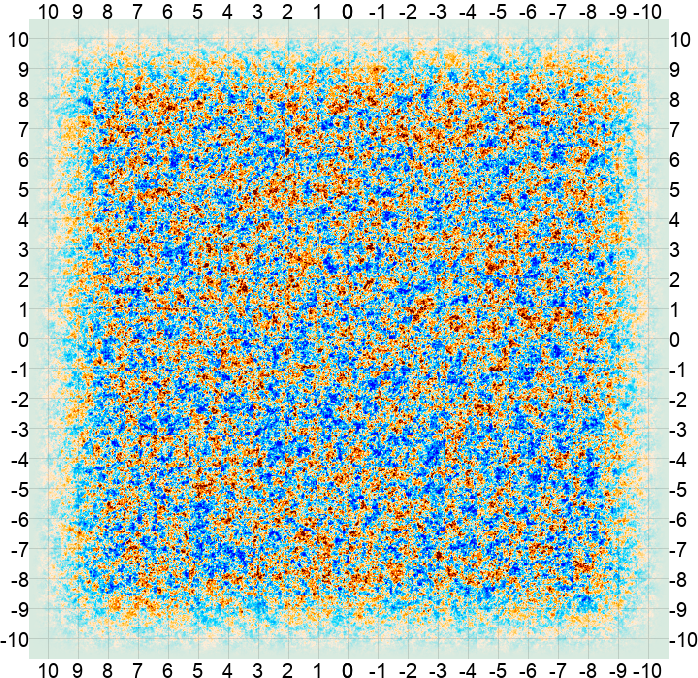

20.16375566726725


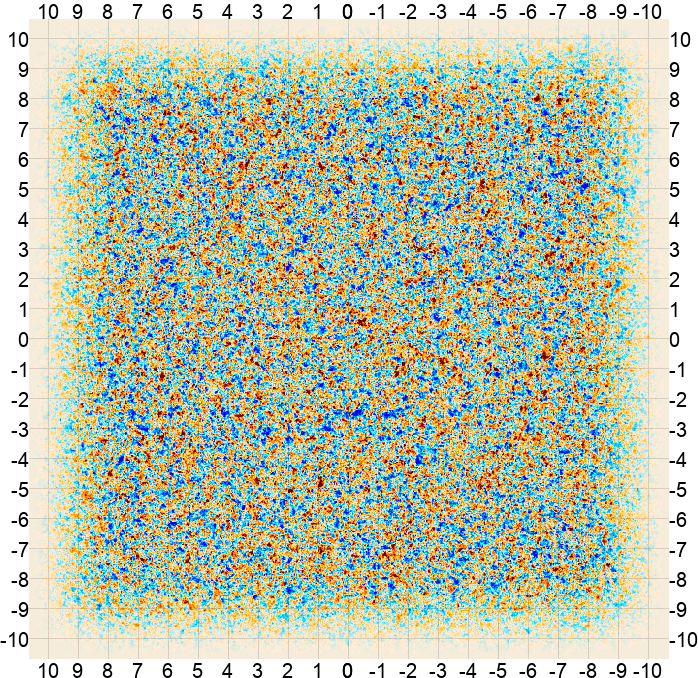

-1.2223393271845286e-10


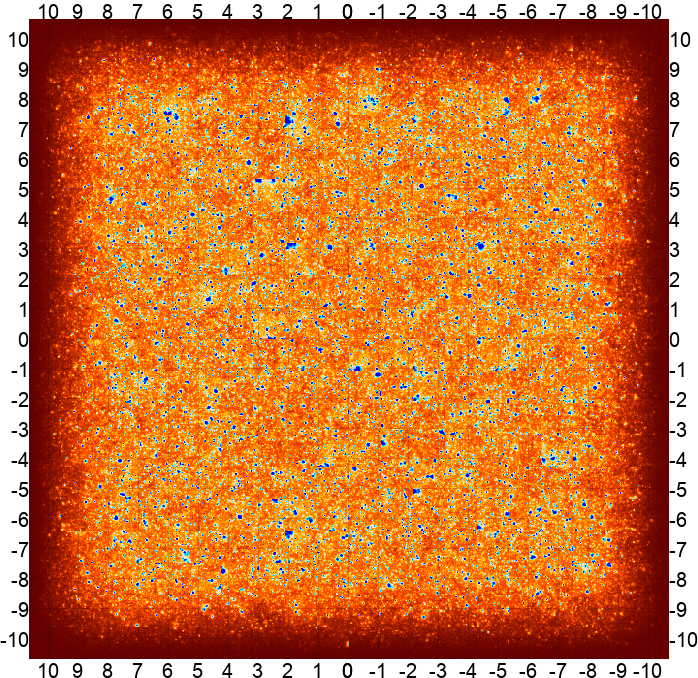

133.38168769076168


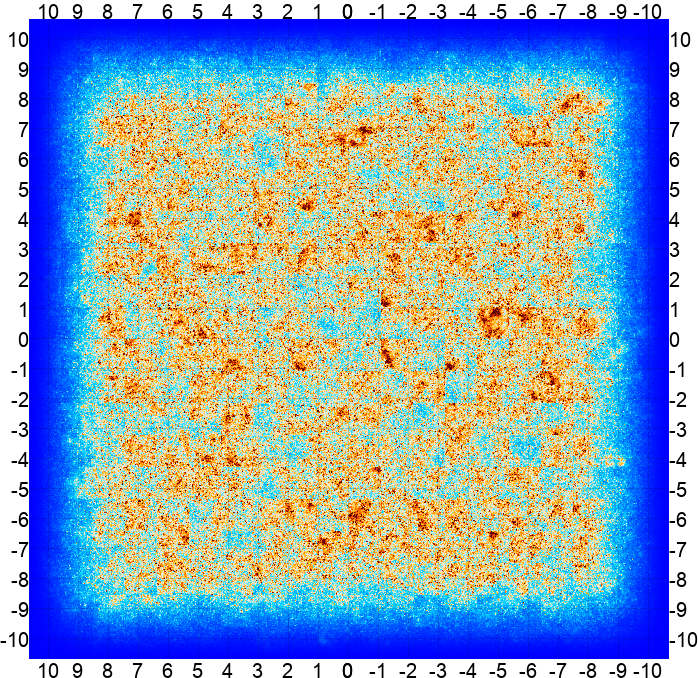

628.8475763006321


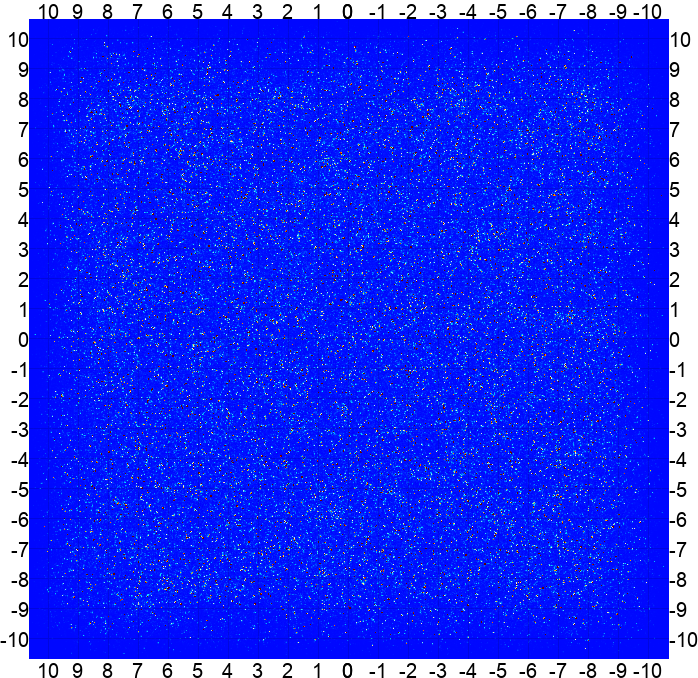

Traceback (most recent call last):
  File "/home/dwhan89/.miniconda3/lib/python3.7/site-packages/mlflow/store/tracking/file_store.py", line 197, in list_experiments
    experiment = self._get_experiment(exp_id, view_type)
  File "/home/dwhan89/.miniconda3/lib/python3.7/site-packages/mlflow/store/tracking/file_store.py", line 260, in _get_experiment
    meta = read_yaml(experiment_dir, FileStore.META_DATA_FILE_NAME)
  File "/home/dwhan89/.miniconda3/lib/python3.7/site-packages/mlflow/utils/file_utils.py", line 167, in read_yaml
    raise MissingConfigException("Yaml file '%s' does not exist." % file_path)
mlflow.exceptions.MissingConfigException: Yaml file '/home/dwhan89/workspace/cosmikyu/cosmikyu/../output/mlruns/mlruns/meta.yaml' does not exist.


[WARNING] You have a CUDA device. You probably want to run with CUDA enabled
loading saved states _35
processing sim 0
19.611767 -5.984049
0.5150843803046692


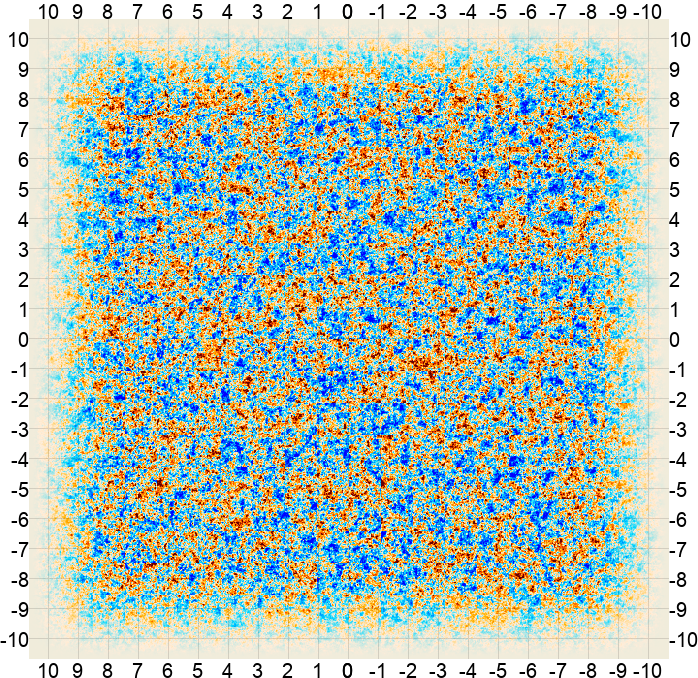

18.526639202033003


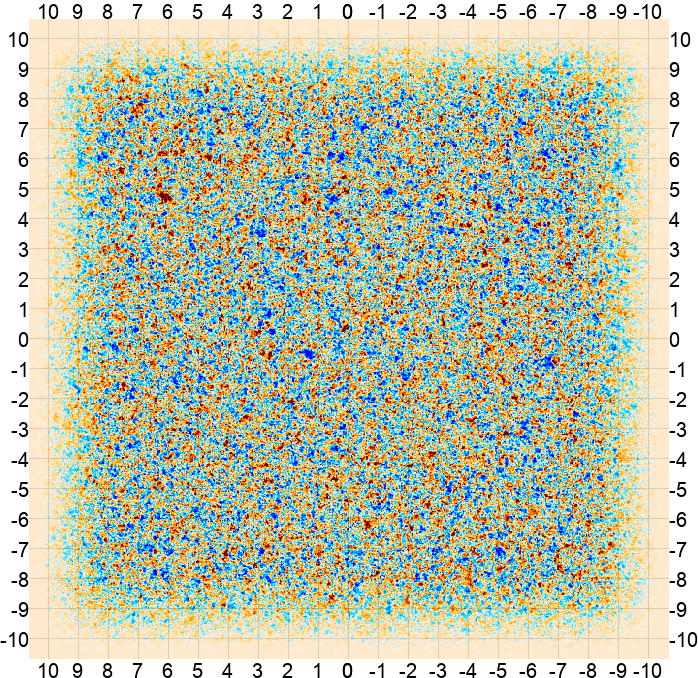

0.011349043526974743


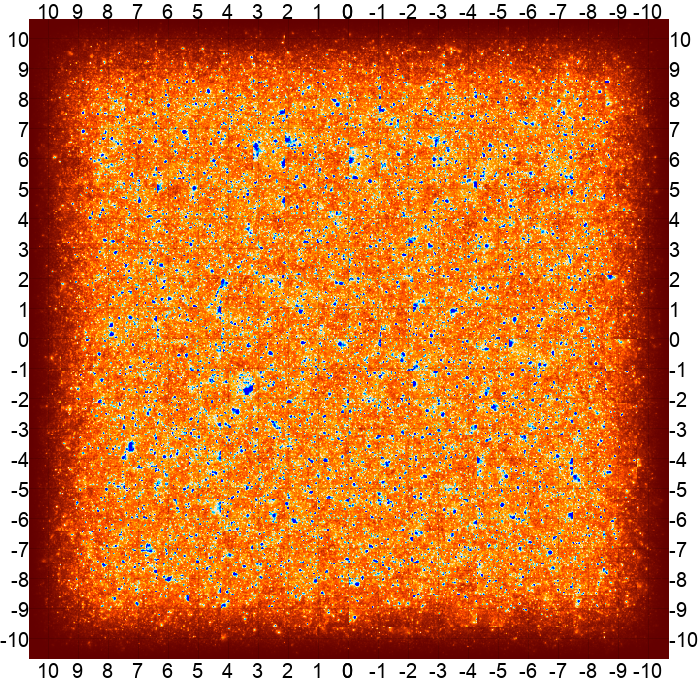

328.7036719370739


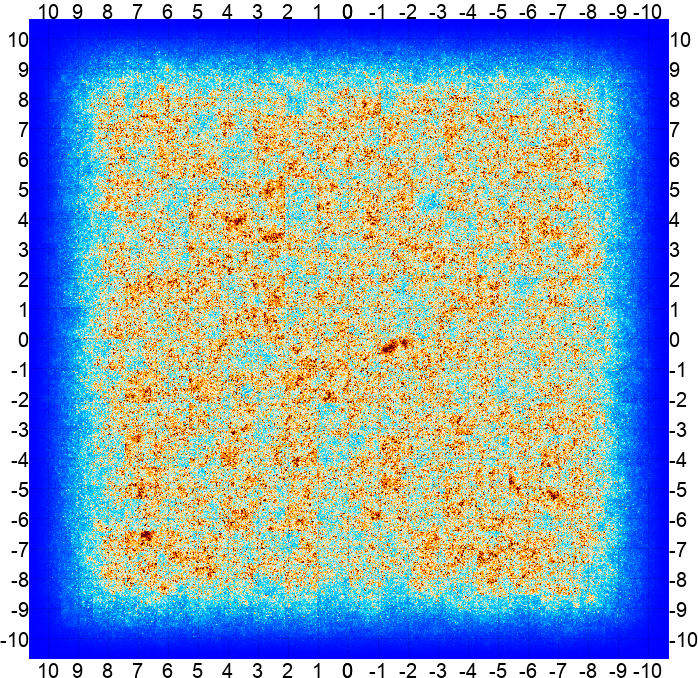

657.8110379218322


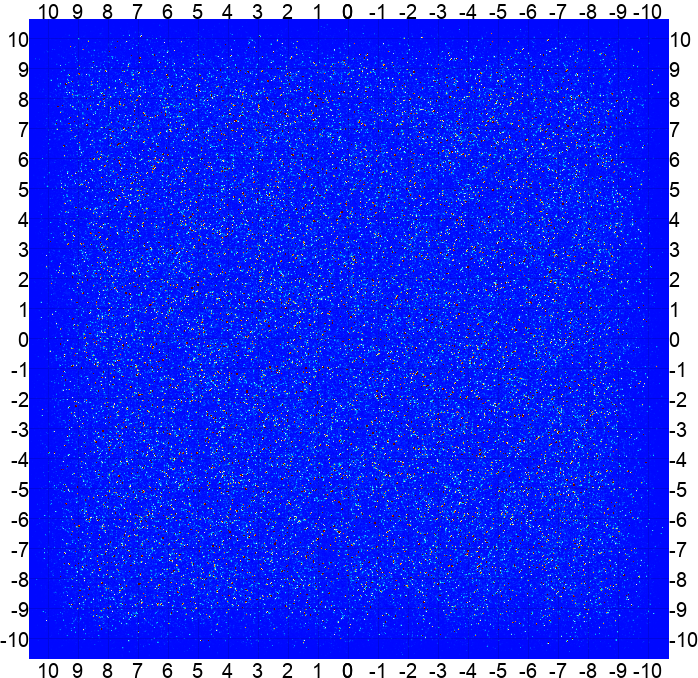

Traceback (most recent call last):
  File "/home/dwhan89/.miniconda3/lib/python3.7/site-packages/mlflow/store/tracking/file_store.py", line 197, in list_experiments
    experiment = self._get_experiment(exp_id, view_type)
  File "/home/dwhan89/.miniconda3/lib/python3.7/site-packages/mlflow/store/tracking/file_store.py", line 260, in _get_experiment
    meta = read_yaml(experiment_dir, FileStore.META_DATA_FILE_NAME)
  File "/home/dwhan89/.miniconda3/lib/python3.7/site-packages/mlflow/utils/file_utils.py", line 167, in read_yaml
    raise MissingConfigException("Yaml file '%s' does not exist." % file_path)
mlflow.exceptions.MissingConfigException: Yaml file '/home/dwhan89/workspace/cosmikyu/cosmikyu/../output/mlruns/mlruns/meta.yaml' does not exist.


[WARNING] You have a CUDA device. You probably want to run with CUDA enabled


Traceback (most recent call last):
  File "/home/dwhan89/.miniconda3/lib/python3.7/site-packages/mlflow/store/tracking/file_store.py", line 197, in list_experiments
    experiment = self._get_experiment(exp_id, view_type)
  File "/home/dwhan89/.miniconda3/lib/python3.7/site-packages/mlflow/store/tracking/file_store.py", line 260, in _get_experiment
    meta = read_yaml(experiment_dir, FileStore.META_DATA_FILE_NAME)
  File "/home/dwhan89/.miniconda3/lib/python3.7/site-packages/mlflow/utils/file_utils.py", line 167, in read_yaml
    raise MissingConfigException("Yaml file '%s' does not exist." % file_path)
mlflow.exceptions.MissingConfigException: Yaml file '/home/dwhan89/workspace/cosmikyu/cosmikyu/../output/mlruns/mlruns/meta.yaml' does not exist.


loading saved states _40
processing sim 0
[WARNING] You have a CUDA device. You probably want to run with CUDA enabled
loading saved states _45
processing sim 0
[STATS] collecting data
[STATS] saving /home/dwhan89/workspace/cosmikyu/cosmikyu/../data/sehgal/stats/stats_a7f687e4e2fa4dd3b02096c56b850527.npz from root 0
[STATS] loaded /home/dwhan89/workspace/cosmikyu/cosmikyu/../data/sehgal/stats/stats_a7f687e4e2fa4dd3b02096c56b850527.npz
calculating stats


/home/dwhan89/workspace/cosmikyu/cosmikyu/stats.py:118: RuntimeWarning: Degrees of freedom <= 0 for slice
  cov = np.cov(data.transpose(), ddof=ddof)
/home/dwhan89/.local/lib/python3.7/site-packages/numpy/lib/function_base.py:2480: RuntimeWarning: divide by zero encountered in true_divide
  c *= np.true_divide(1, fact)
/home/dwhan89/.local/lib/python3.7/site-packages/numpy/lib/function_base.py:2480: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)
/home/dwhan89/.local/lib/python3.7/site-packages/numpy/lib/function_base.py:2551: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar)
/home/dwhan89/.local/lib/python3.7/site-packages/numpy/core/_methods.py:234: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/dwhan89/.local/lib/python3.7/site-packages/numpy/core/_methods.py:224: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)


In [30]:

STanh = cnn.ScaledTanh(30., 2./30.)
LF = cnn.LinearFeature(5,5)
norm_info_file = "/home/dwhan89/workspace/cosmikyu/data/sehgal/201020_logzshrink_normalization_info_validation.npz"
#experiment_id = "0adc70bef2ba4fb3b3800c86ef095ce8"
experiment_id = "a7f687e4e2fa4dd3b02096c56b850527"
#experiment_id = "ec72a32f599f4ccda54a556ba56abea4"
#experiment_id = "e2d04f98e77a49c5804db3379217986f"
model_dir = "/home/dwhan89/workspace/cosmikyu/output/sehgal_forse_081020/{}/model".format(experiment_id)
print(model_dir)
overwrite =False
SDN = transforms.SehgalDataNormalizerScaledLogZShrink(norm_info_file)
SDUN = transforms.SehgalDataUnnormalizerScaledLogZShrink(norm_info_file)
STAT_GEN = stats.STATS(experiment_id, output_dir=stat_dir, overwrite=overwrite)
save_points = [0,10,20,30,35,40,45]#0,1,2,3,4,5,6,7,8]
#save_points = np.arange(1,18,1)
#np.arange(20,32,2)#[0]#,15]#np.arange(0,35,5)#np.arange(0,50,10)
nsim = 1
dropout_rate = 0
nconv_layer = 5
gen_act = [LF, STanh]
#gen_act = [STanh]
SDS_input = datasets.SehgalDataSet(sehgal_dir, "train_tertiary191120", 
                                   transforms=[SDN], dummy_label=False, dtype=np.float32)


for save_point in save_points: 
    compts = ["kappa", "ksz", "tsz", "ir", "rad"]
    FORSE = gan.FORSE_WGP("sehgal_forse_081020", (5,)+shape, nconv_fcgen=64,
                          nconv_fcdis=64, cuda=cuda, ngpu=4, nconv_layer_gen=nconv_layer, nconv_layer_disc=nconv_layer, kernal_size=4, stride=2,
                          padding=1, output_padding=0, gen_act=[LF,STanh], nin_channel=5, 
                          nout_channel=5, nthresh_layer_gen=0, nthresh_layer_disc=0, dropout_rate=0)


    #PIXGAN.generator.train()


    FORSE.load_states(model_dir, "_{}".format(save_point))
    
    def get_generated(wcs=bwcs, nside=nside, gan=FORSE, taper=True):
        shape = gan.shape
        nx, ny = shape[1], shape[2]
        nshape = (shape[0], shape[1]*nside, shape[2]*nside)
        temp = enmap.zeros(nshape, wcs)
        np.random.seed(None)
        #generated = gan.generate_samples(nside*nside).data.numpy()
        nrepeat = 1
       
        temp_ctr = 0
        for i in range(nside):
            for j in range(nside):
                cidx = random.randint(0, len(SDS_input)-1)
                sx = i*nx
                sy = j*ny
                ctr = 0
                while(ctr < nrepeat):
                    stamp =  FORSE.generate_samples(SDS_input[cidx], concat=False, train=False).data.numpy()[0]
                    
                    temp[:,sy:sy+ny,sx:sx+nx] += stamp
                    ctr += 1
                    temp_ctr += 1
        print(np.max(stamp), np.min(stamp))
        temp /= nrepeat
        temp = SDUN(temp)
        if taper:
            temp[...] *= get_mask()
        return temp
    
    subtasks = np.arange(nsim, dtype=np.int)
    for sim_idx in subtasks:
        print("processing sim {}".format(sim_idx))
        stat_key = "dls_radxrad_r{}".format(save_point)
        if STAT_GEN.has_data(stat_key, sim_idx):
            continue
        emap = get_generated()
        for i in range(0, 5):
            if sim_idx == subtasks[-1]:
                print(np.max(emap[i]))
                enplot.pshow(emap[i], downgrade=4)
        alms = {}
        for i, compt_idx in enumerate(compts):
            #enplot.pshow(emap[i])
            alms[compt_idx] = curvedsky.map2alm(emap[i], lmax=lmax)
        del compt_idx
        
        for compt_idx1, compt_idx2 in product(compts, compts):
            compt_keys = [compt_idx1, compt_idx2]
            compt_keys.sort()
            stat_key = "dls_{}x{}_r{}".format(compt_keys[0], compt_keys[1],save_point)
            if STAT_GEN.has_data(stat_key, sim_idx):
                continue
            else:
                cl = hp.alm2cl(alms[compt_idx1], alms[compt_idx2])
                l = np.arange(len(cl), dtype=np.float)
                dl = l*(l+1.)/(2*np.pi)*cl
                lbin, dlbin = PITAS.binner.bin(l, dl)
                dlbin = np.dot(PITAS.mcm_dltt_inv, dlbin)
                STAT_GEN.add_data("lbin", 0, lbin)
                STAT_GEN.add_data(stat_key, sim_idx, dlbin)

        #del alms
_ = STAT_GEN.get_stats(save_data=True)

In [31]:
for save_point in save_points:
    FORSE.load_states(model_dir, "_{}".format(save_point))
    print(FORSE.generator.model_dict["LF"].weight)
    print(FORSE.generator.model_dict["LF"].bias)

loading saved states _0


/home/dwhan89/.miniconda3/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Parameter containing:
tensor([1.0143, 0.9811, 1.0044, 1.0377, 1.0254], requires_grad=True)
Parameter containing:
tensor([0.0183, 0.0008, 0.0013, 0.0148, 0.0025], requires_grad=True)
loading saved states _10
Parameter containing:
tensor([1.0211, 0.9773, 0.9428, 1.0162, 1.0838], requires_grad=True)
Parameter containing:
tensor([ 0.0137, -0.0033,  0.0031,  0.0093, -0.0033], requires_grad=True)
loading saved states _20
Parameter containing:
tensor([0.9999, 0.9720, 0.9296, 1.0074, 1.1265], requires_grad=True)
Parameter containing:
tensor([ 0.0149, -0.0033,  0.0023,  0.0083,  0.0004], requires_grad=True)
loading saved states _30
Parameter containing:
tensor([0.9665, 0.9647, 0.9219, 0.9984, 1.1685], requires_grad=True)
Parameter containing:
tensor([ 0.0152, -0.0050,  0.0018,  0.0079,  0.0034], requires_grad=True)
loading saved states _35
Parameter containing:
tensor([0.9436, 0.9592, 0.9174, 0.9934, 1.1869], requires_grad=True)
Parameter containing:
tensor([ 0.0155, -0.0060,  0.0015,  0.0082, 

1.0 1.0 True
1.051583541172773 1.0254674744587333 True
1.2018545392212097 1.09629126568682 True
1.0007526537670355 1.0003762560991916 True
0.911778610764574 0.954870991686612 True


/home/dwhan89/.miniconda3/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


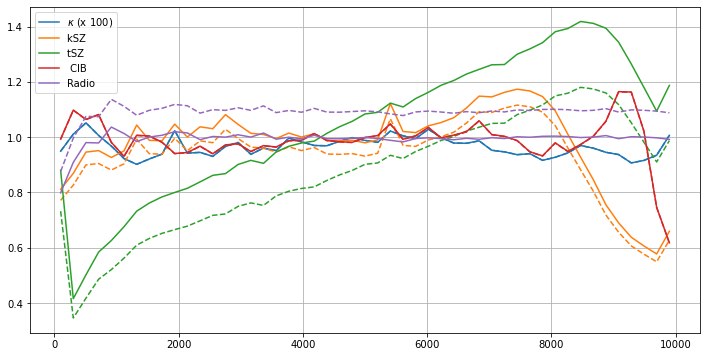

In [33]:
import scipy
    
def key2label(key):
    storage = {"kappa":r"$  \kappa$ (x 100)",
               "ksz":"kSZ ",
               "tsz":"tSZ ",
               "ir":" CIB ",
               "rad":"Radio",
              }
    return storage[key]
    
fig = plt.figure(figsize=(12,6))
ax = fig.gca()
for key1 in compts:
    #if key1 == "kappa": continue
    key2 = key1
    key = [key1, key2]
    key.sort()
    key = "dls_"+"x".join(key)
    skey = key+"_r{}".format(save_points[-1])

    
    
    lbin = STAT_TEST.storage["lbin"][0]
    dlbin_test = STAT_TEST.stats[key]["mean"]
    std_test = STAT_TEST.stats[key]["std"]
    dlbin_gen = STAT_GEN.stats[skey]["mean"]
    std_gen = STAT_GEN.stats[skey]["std"]
    
        
    def f(a, gen_spec=(dlbin_gen,std_gen), ref_spec=(dlbin_test,std_test), lbin=lbin, lmin=4000, lmax=4500):
        gen, std_gen = gen_spec
        ref, std_ref = ref_spec
        loc = ((lbin>=lmin) & (lbin <= lmax))
        #print( np.mean(np.abs((a*gen)/ref)[loc]))
        ret = np.sum((((a*gen-ref)/1)**2)[loc])
        return ret
        #return np.abs(np.mean(((a*gen)/ref-1)[loc]))
    
    ret = scipy.optimize.minimize(f, 1)
    corr = ret["x"][0] if ret["success"] else 1
    print(corr, np.sqrt(corr),ret["success"] )
    
    color = next(ax._get_lines.prop_cycler)['color']
    plt.plot(lbin, (corr*dlbin_gen/dlbin_test), label=key2label(key1), color=color)
    plt.plot(lbin, (dlbin_gen/dlbin_test), ls="--", color=color)

plt.yscale("linear")
plt.grid()
plt.legend()
plt.show()

/home/dwhan89/.miniconda3/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<Figure size 432x288 with 0 Axes>

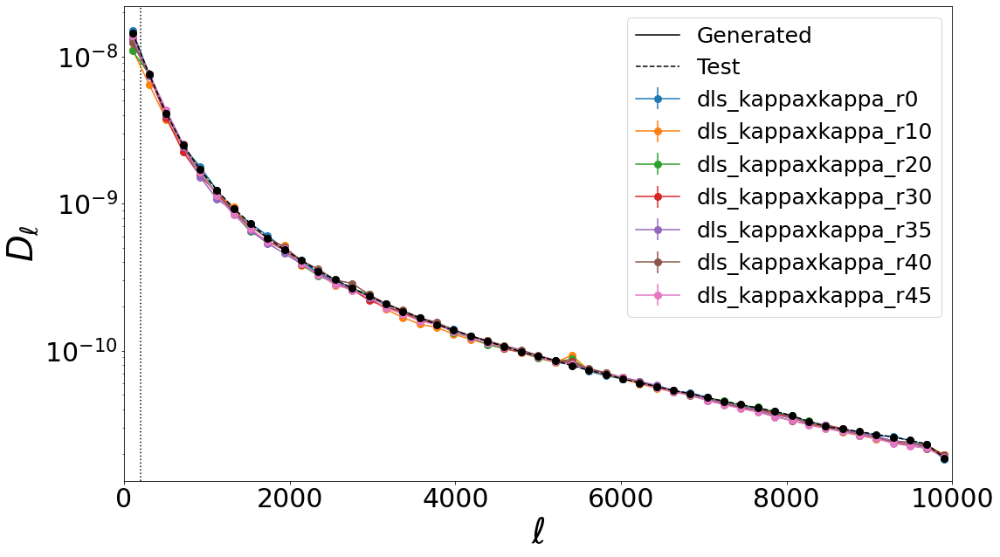

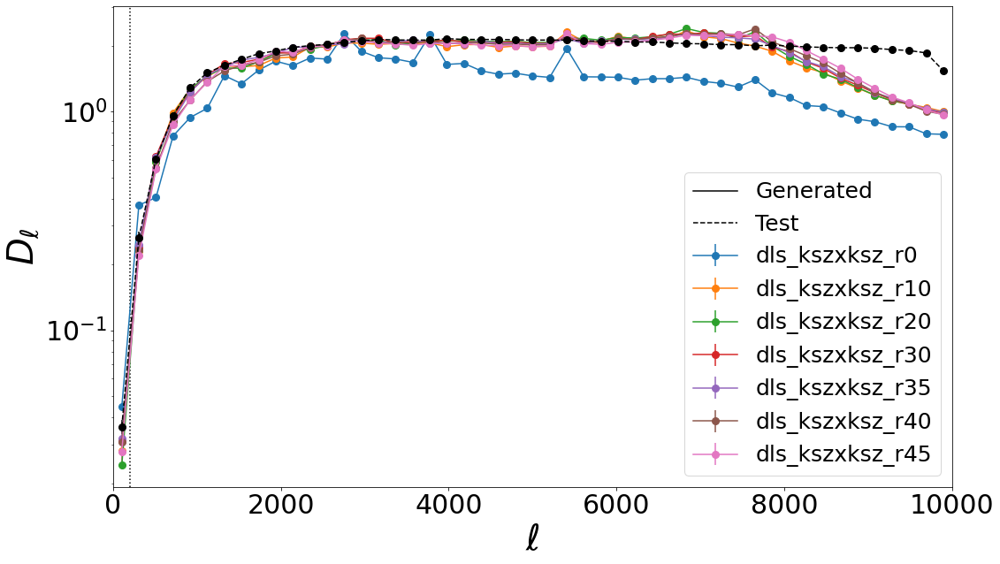

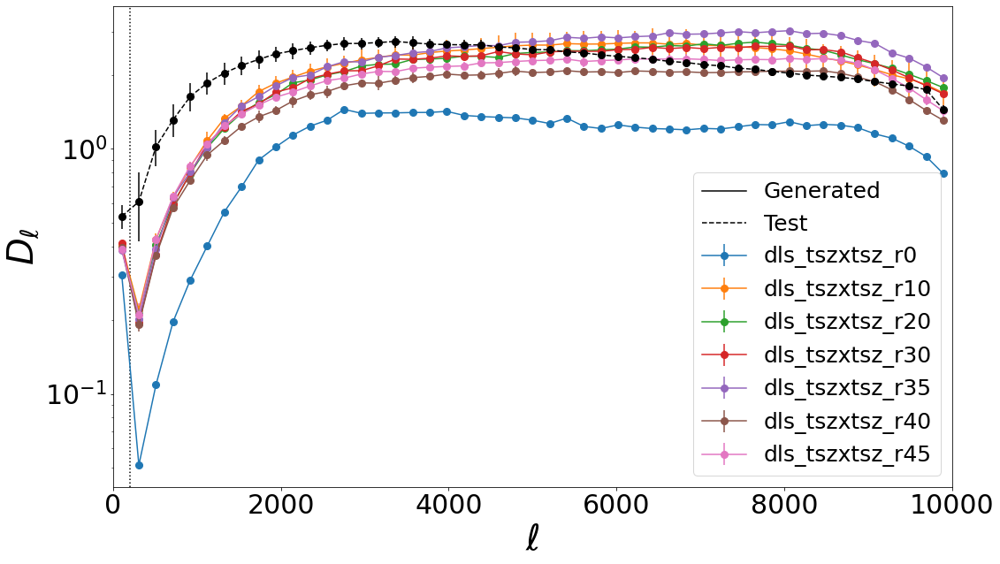

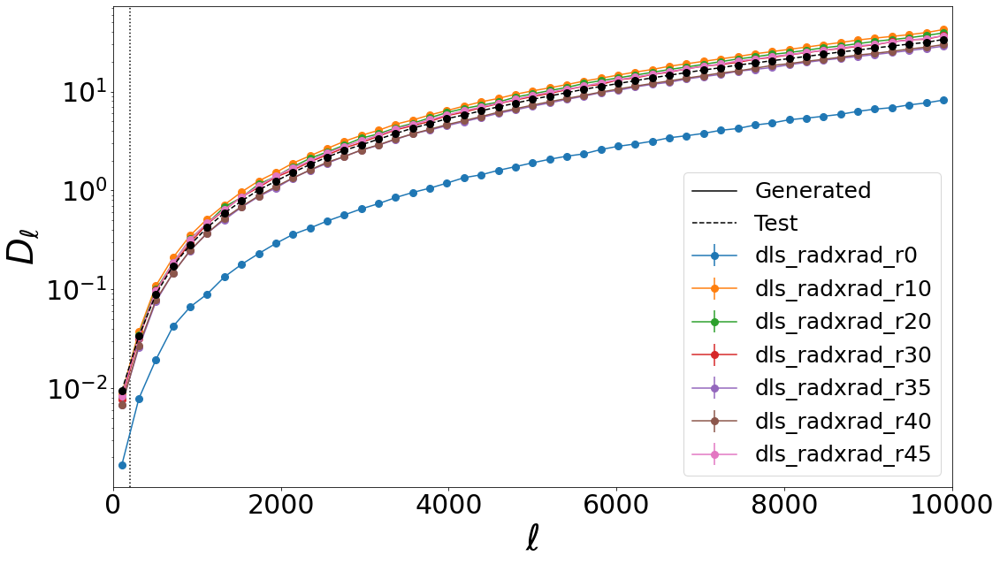

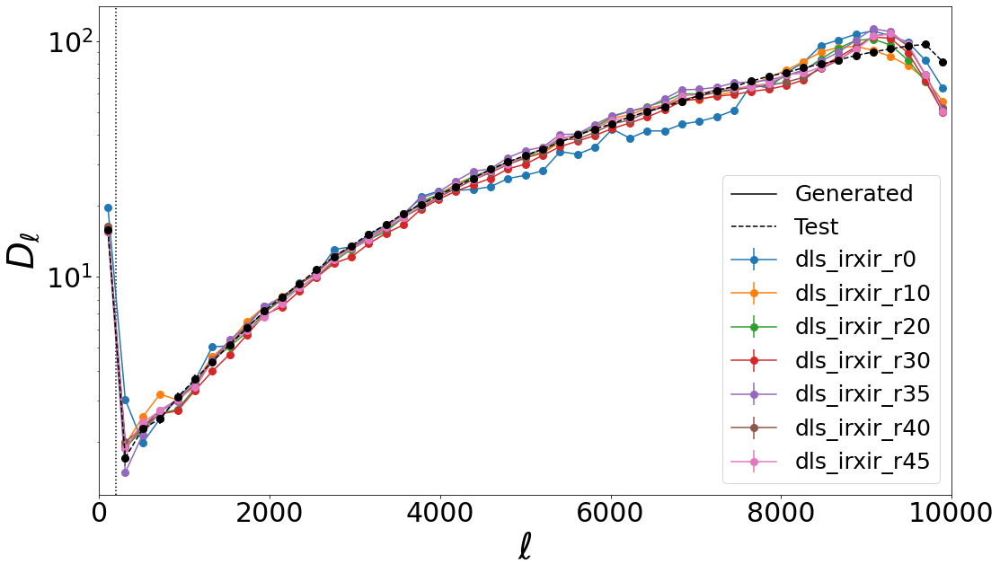

In [34]:
plt.clf()
compts = ["kappa", "ksz", "tsz", "rad", "ir"]
for key1 in compts:
    fig = plt.figure(figsize=(17,10))
    ax = fig.gca()
    key2 = key1
    key = [key1, key2]
    key.sort()
    key = "dls_"+"x".join(key)
   
    mult_fact = 1.2**2 if key1 == "tsza" else 1
    for save_point in save_points[:]:#,20]:
        skey = key + "_r" + str(save_point)
        lbin = STAT_GEN.storage["lbin"][0].copy() 
        dlbin = STAT_GEN.stats[skey]["mean"].copy()*mult_fact
        std = STAT_GEN.stats[skey]["std"].copy()
        if key1 == "kappa":
            dlbin /= lbin**2
            std /= lbin**2
       
        plt.errorbar(lbin, dlbin, std,  marker="o",markersize=8, label=skey)
    #if key1 == "kappa":
    #    clkk_temp =  clkk_bin/lbin**2
    #    plt.plot(lbin,clkk_temp)

    lbin = STAT_TEST.storage["lbin"][0].copy()
    dlbin = STAT_TEST.stats[key]["mean"].copy()
    std = STAT_TEST.stats[key]["std"].copy()
    if key1 == "kappa":
        dlbin /= lbin**2
        std /= lbin**2
    plt.errorbar(lbin, dlbin, std, marker="o",markersize=8, color="k", ls="--")
    plt.plot([],[], ls="-",label="Generated", color="k")
    plt.plot([],[], ls="--",label="Test", color="k")
    ax.tick_params(axis='both', which='major', labelsize=30)
    ax.tick_params(axis='both', which='minor', labelsize=30)
    plt.ylabel(r"$D_\ell$", fontsize=40)
    plt.xlabel(r"$\ell$", fontsize=40)
    plt.legend(fontsize=25)
    #plt.ylim(1e-7,2e3)
    plt.axvline(x=200, ls=":", color="k")
    plt.xlim(0,10000)
    plt.yscale("log")
    plt.show()

<Figure size 432x288 with 0 Axes>

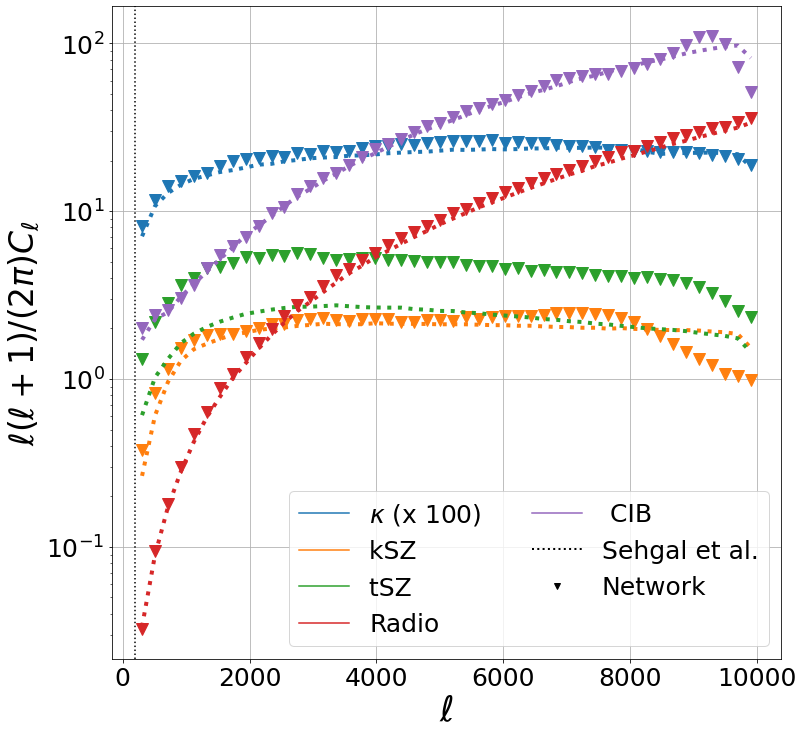

In [28]:
plt.clf()
fig = plt.figure(figsize=(12,12))
ax = fig.gca()


loc = np.where(lbin>200)
for key1 in compts:
    #if key1 == "kappa": continue
    key2 = key1
    key = [key1, key2]
    key.sort()
    key = "dls_"+"x".join(key)
    skey = key+"_r{}".format(save_points[-1])
    multi_fact = 1e4 if key1 == "kappa" else 1
    corr_fact  = 1.2**2 if key1 == "tsza" else 1 
    #multi_fact = 1.2**2 if key1 == "tsz" else 1
 
    color = next(ax._get_lines.prop_cycler)['color']
    
    lbin = STAT_TEST.storage["lbin"][0]#661582ea84424e25bda0534a174d40e4
    dlbin = STAT_TEST.stats[key]["mean"]*multi_fact
    plt.plot(lbin[loc], dlbin[loc], alpha=1, lw=4, marker="",markersize=8, color=color, ls=":")
    lbin = STAT_GEN.storage["lbin"][0]
    dlbin = STAT_GEN.stats[skey]["mean"]*multi_fact*corr_fact
    plt.plot(lbin[loc], dlbin[loc], alpha=1, lw=2, marker="v",markersize=12, color=color, ls="")
    

    plt.plot([],[], label=key2label(key1), color=color)
plt.plot([],[], lw=2, marker="", label="Sehgal et al.", color="k", ls=":")
plt.plot([],[], lw=2, marker="v", ls="", label="Network", color="k")
ax.set_ylabel(r"$\ell(\ell+1)/(2\pi )C_\ell$", fontsize=33)
ax.set_xlabel(r"$\ell$", fontsize=35)
plt.legend(fontsize=25, ncol=2)



ax.tick_params(axis='both', which='major', labelsize=25)
ax.tick_params(axis='both', which='minor', labelsize=25)
ax.axvline(x=200, ls=":", color="k")
ax.set_yscale("log")
ax.grid()
plt.subplots_adjust(wspace=0, hspace=0)
plt.savefig(plot_path("151020_ps_before_transfer.pdf"), bbox_inches='tight')
plt.show()

1


/home/dwhan89/.miniconda3/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


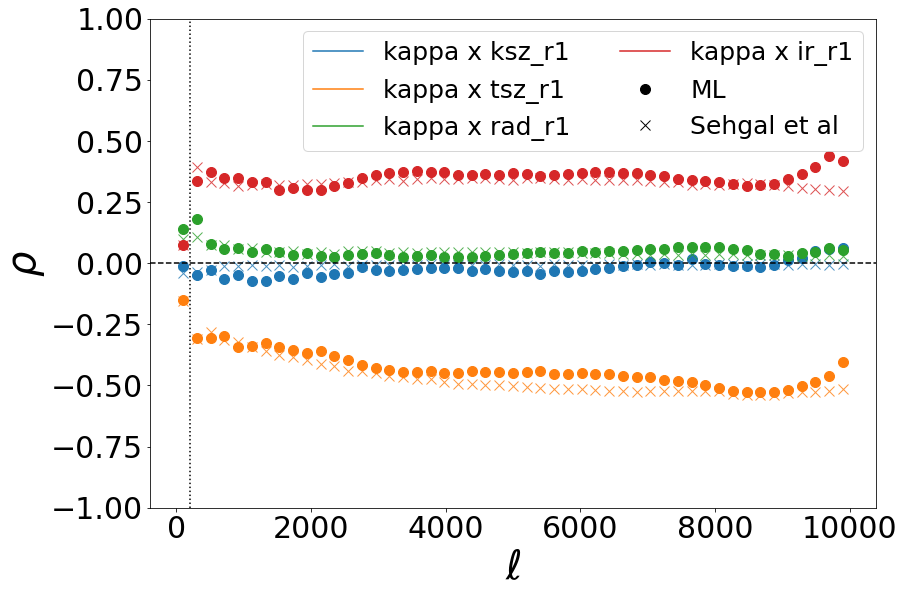

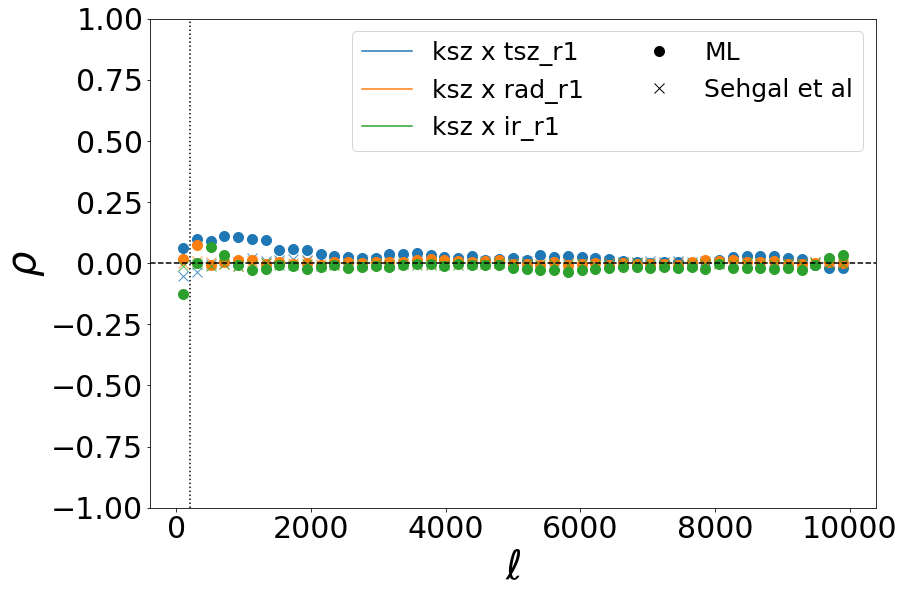

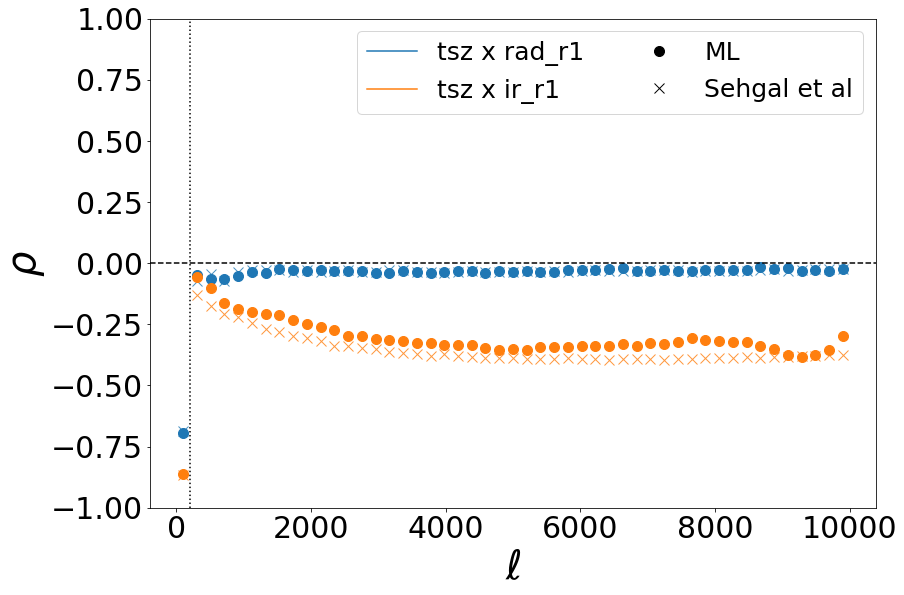

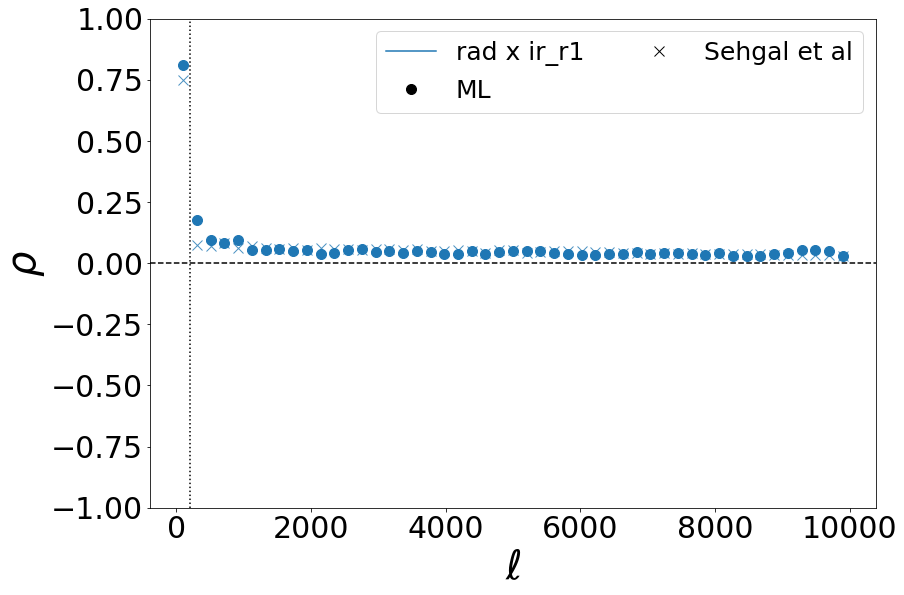

2


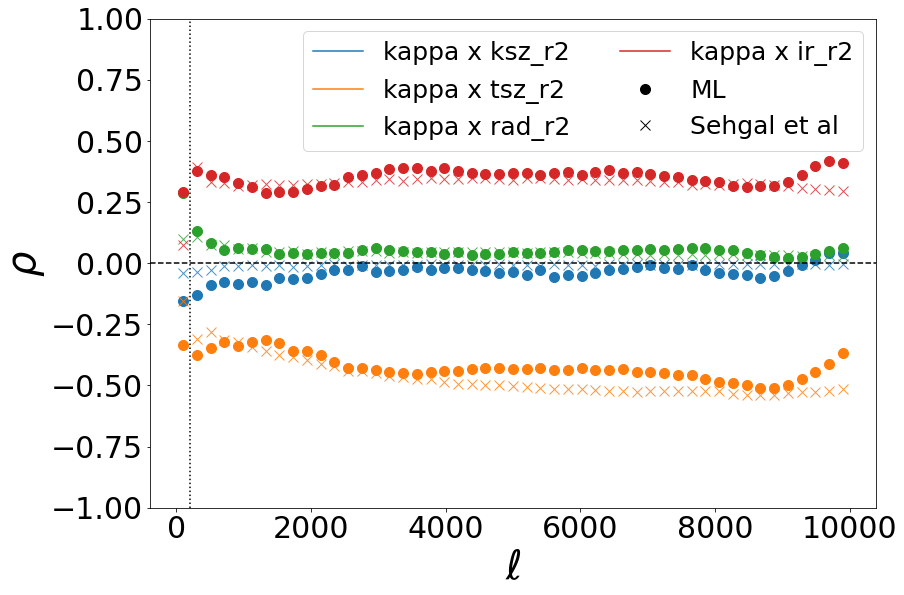

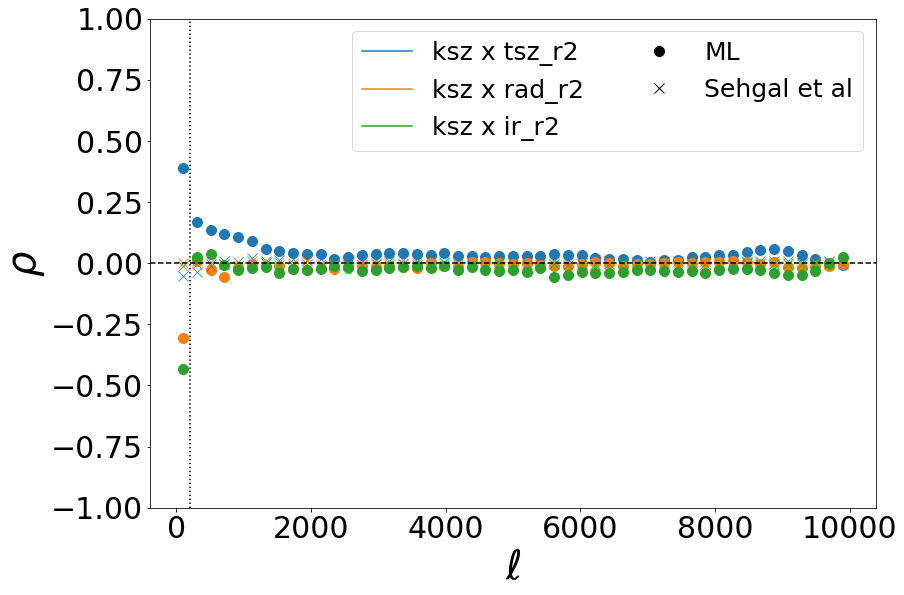

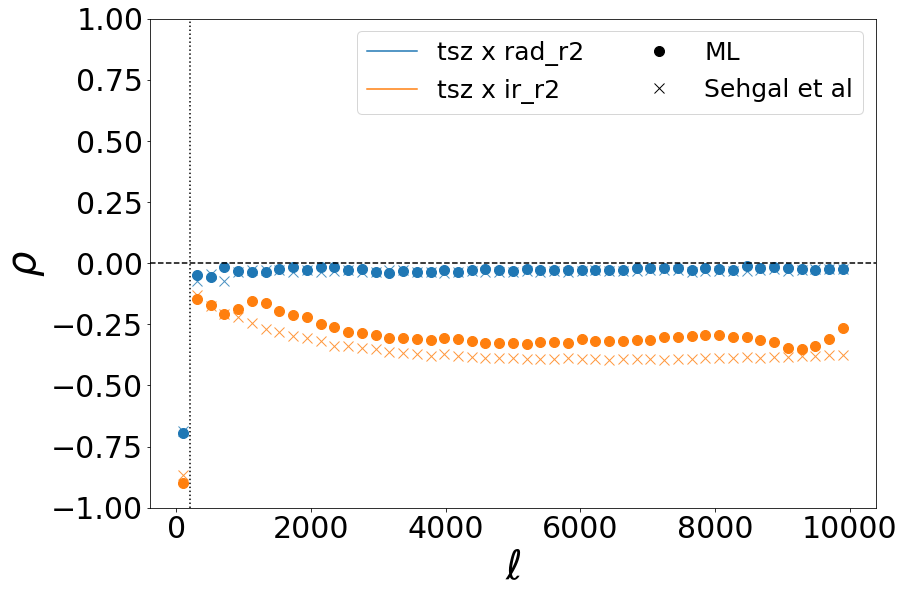

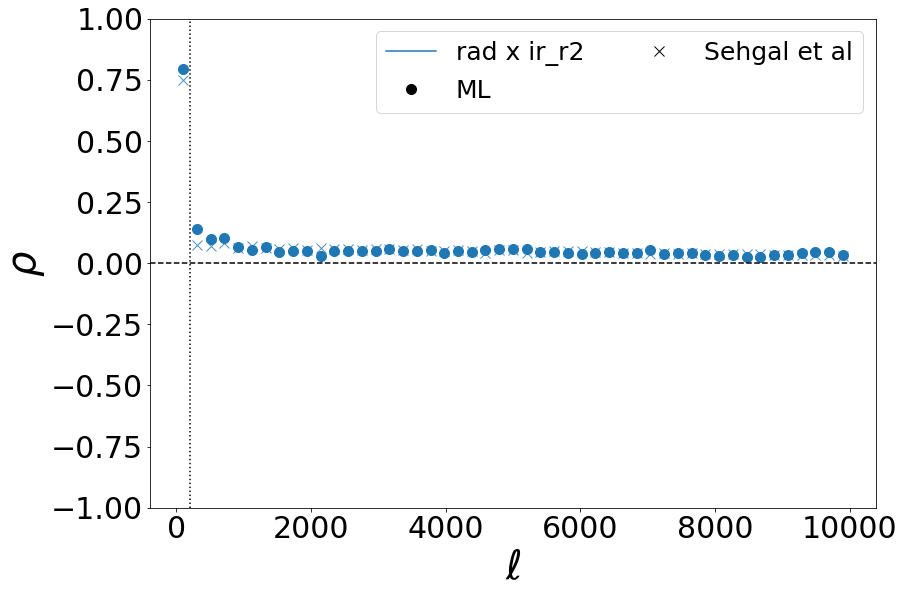

3


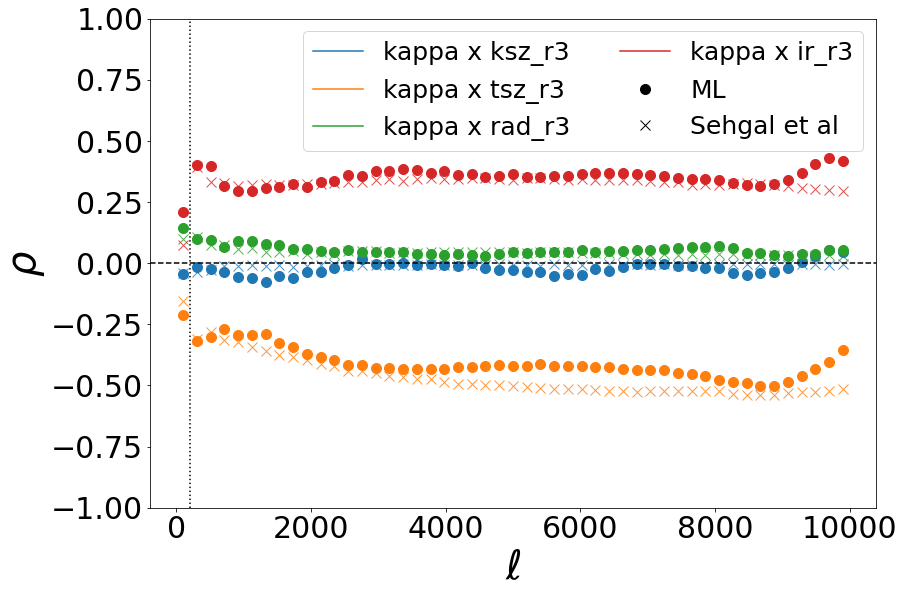

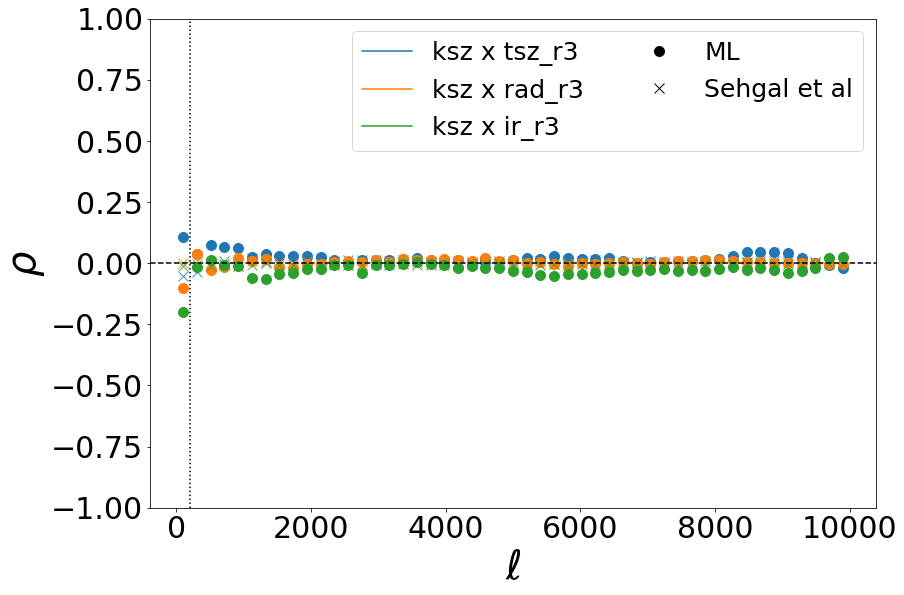

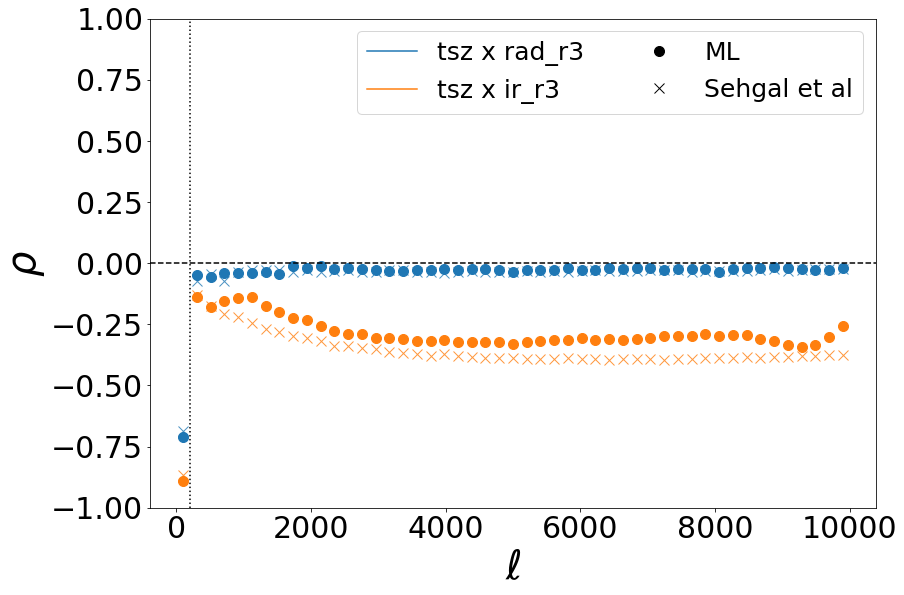

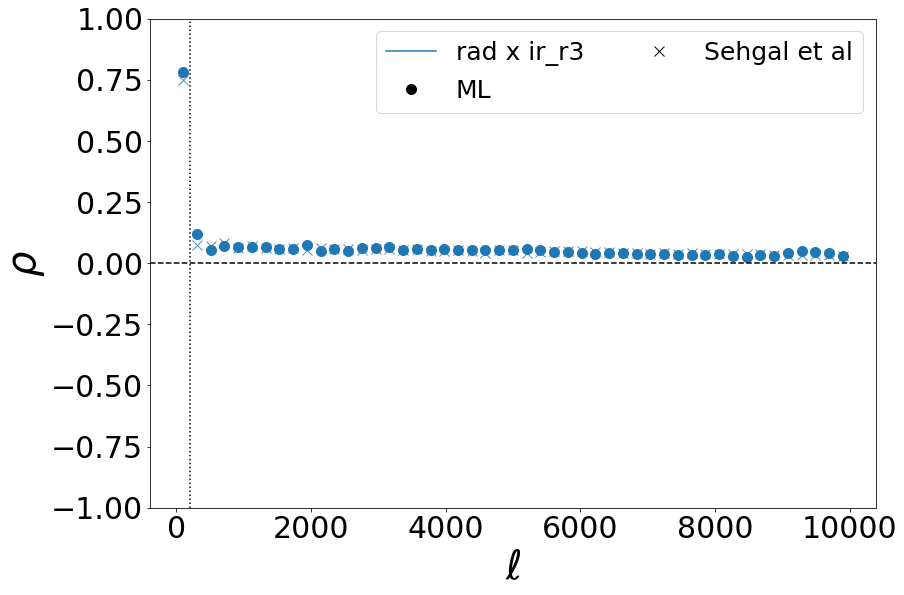

4


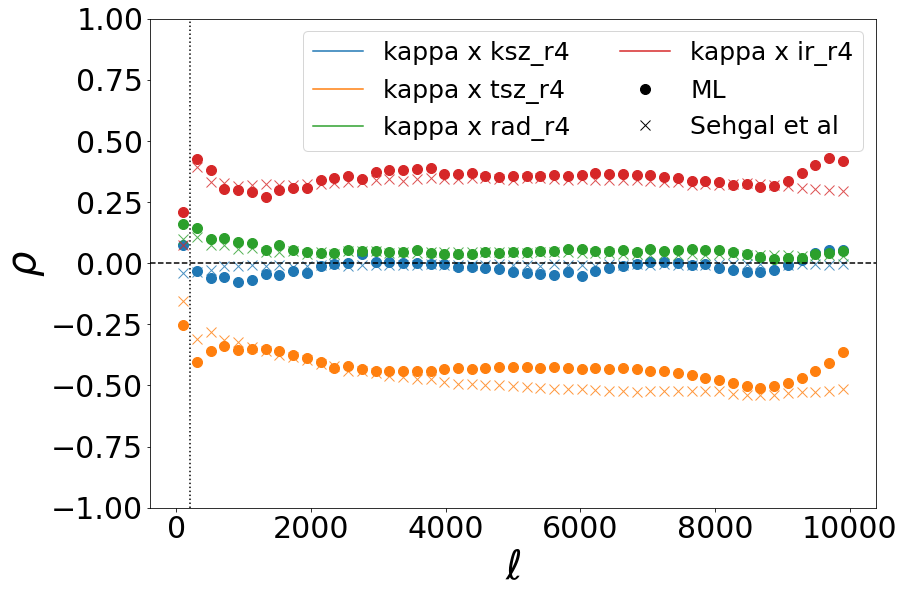

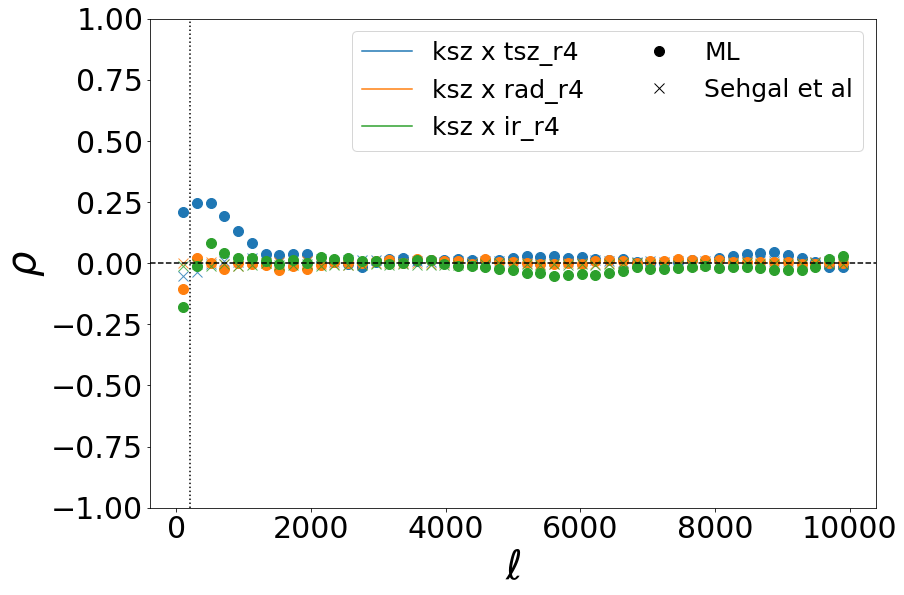

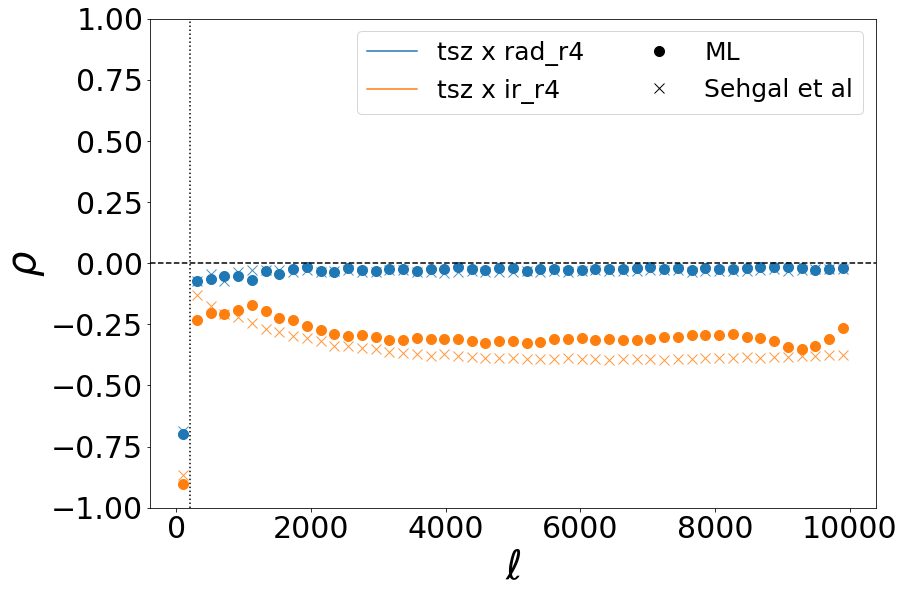

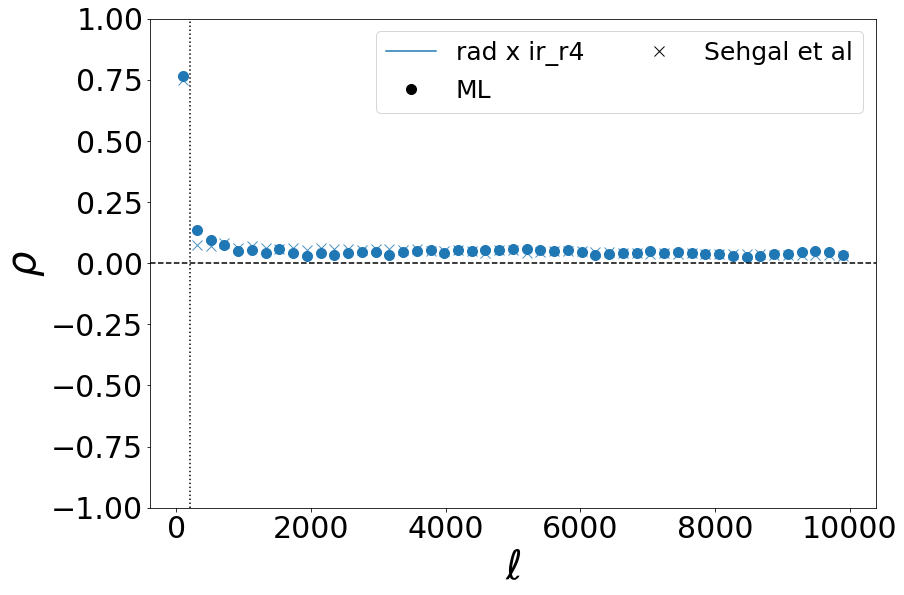

5


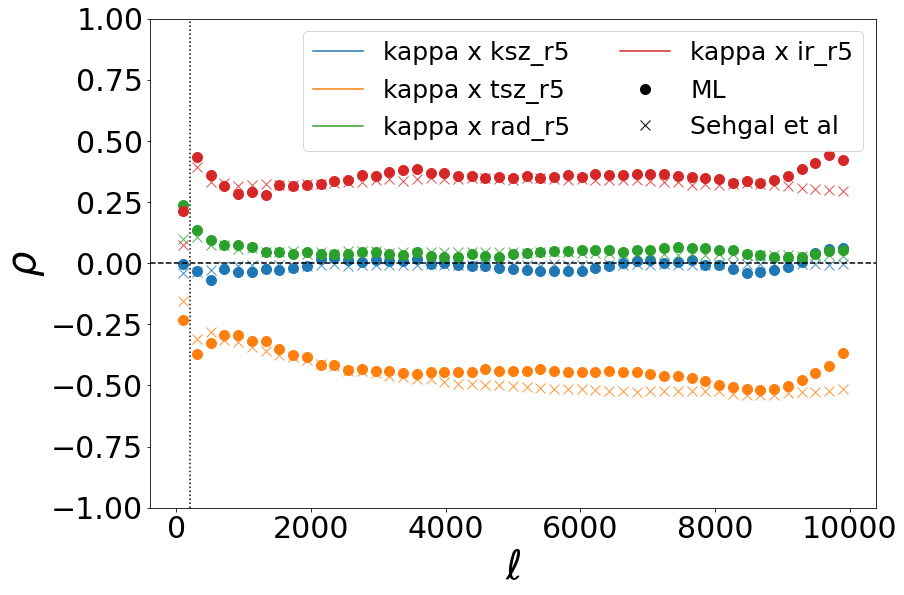

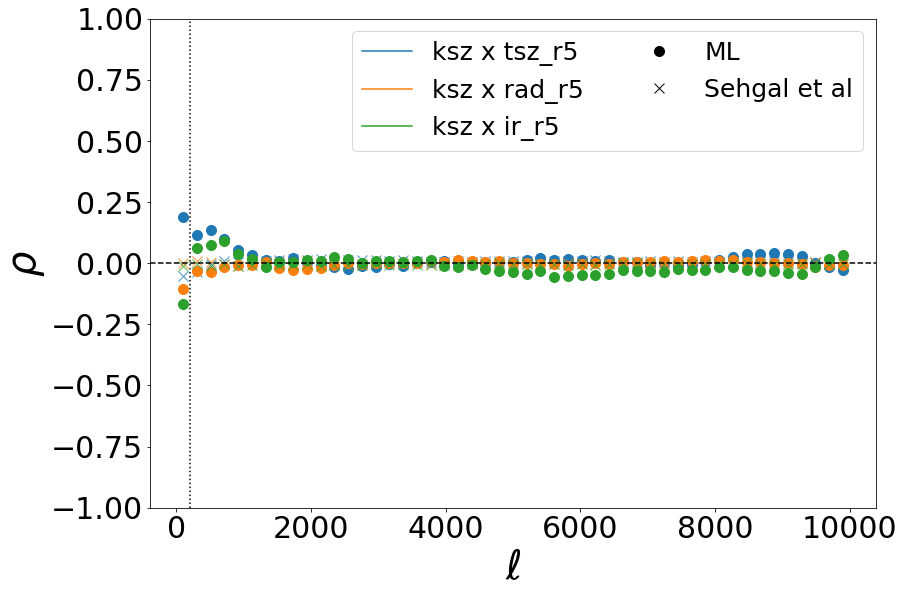

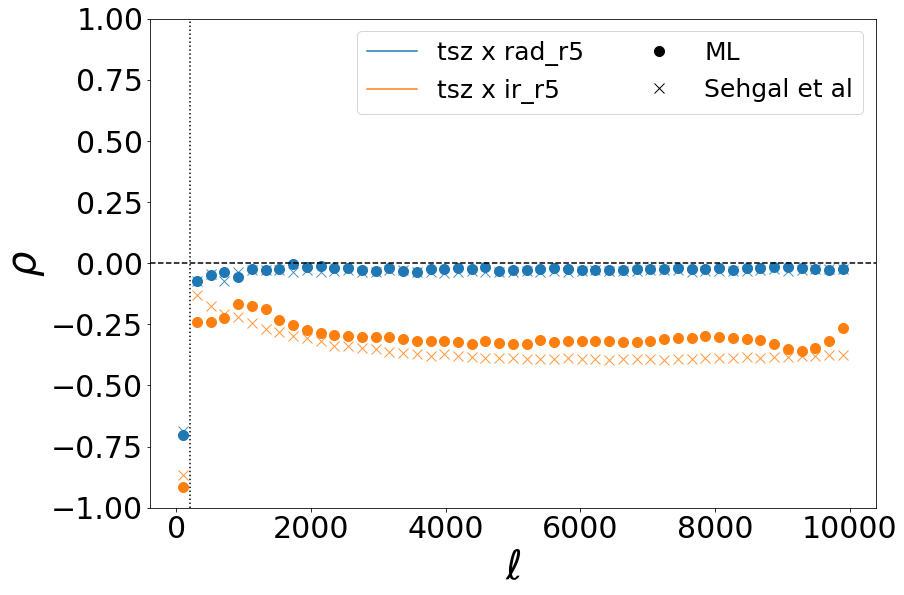

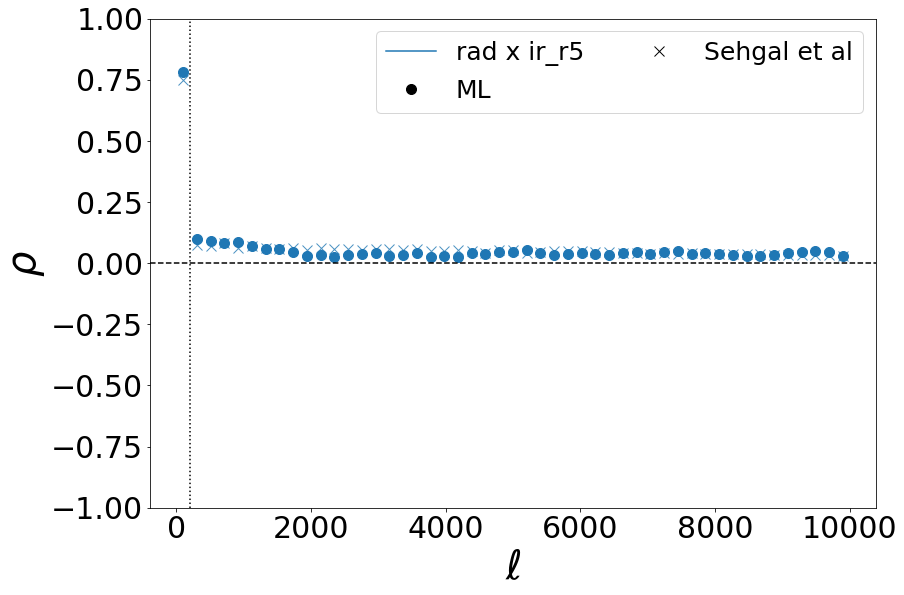

6


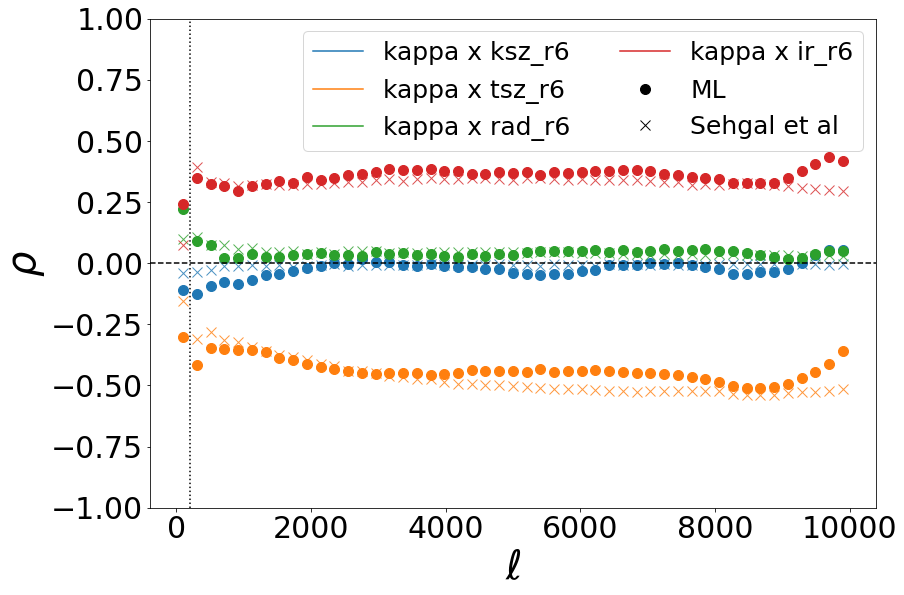

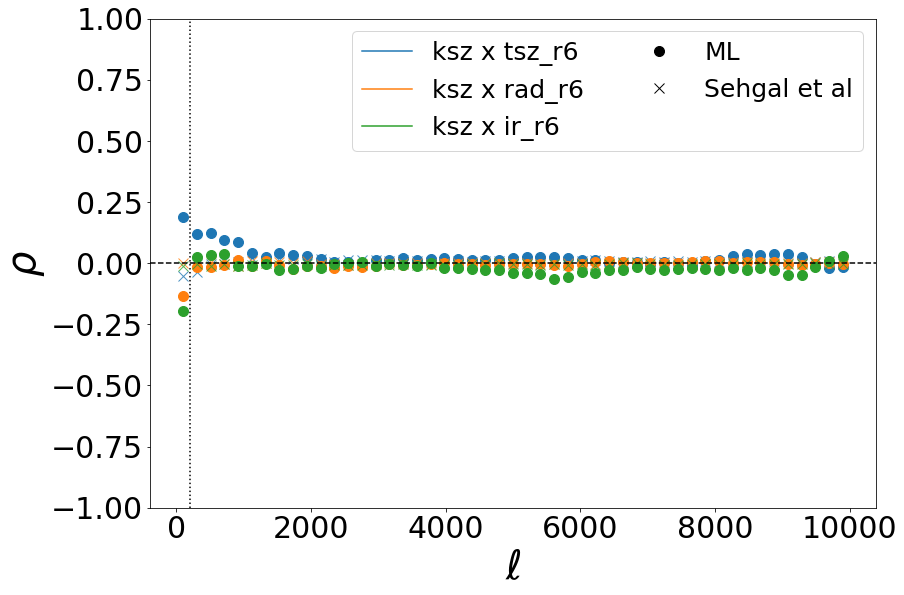

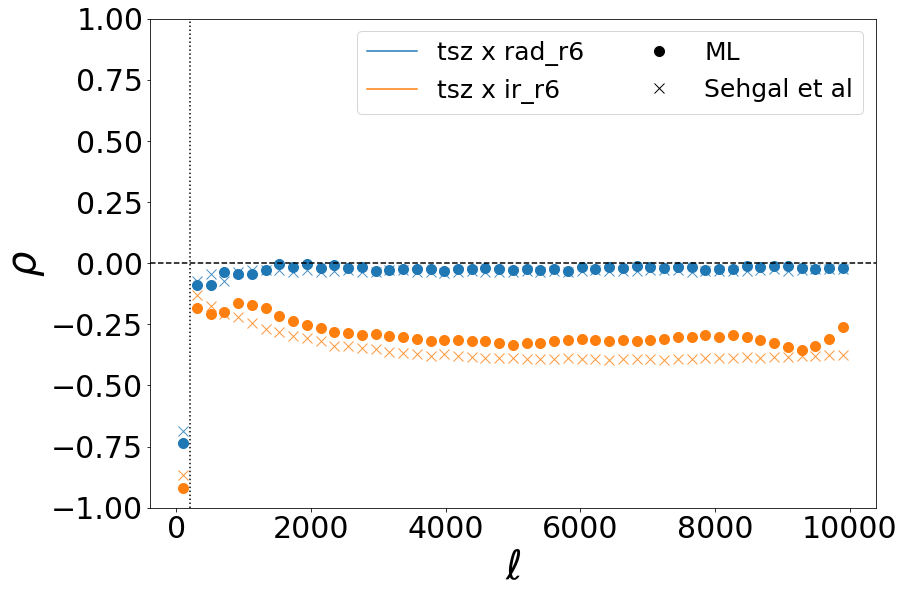

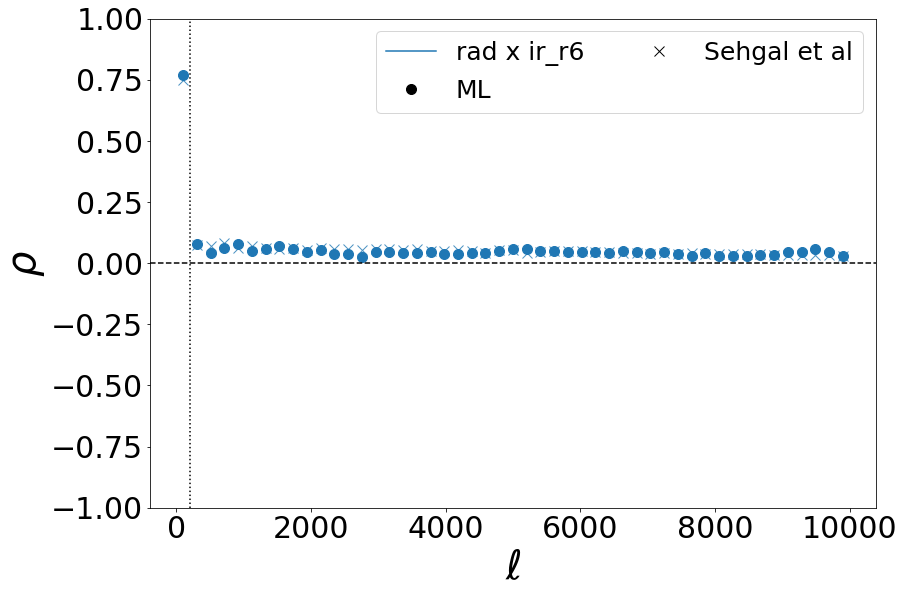

7


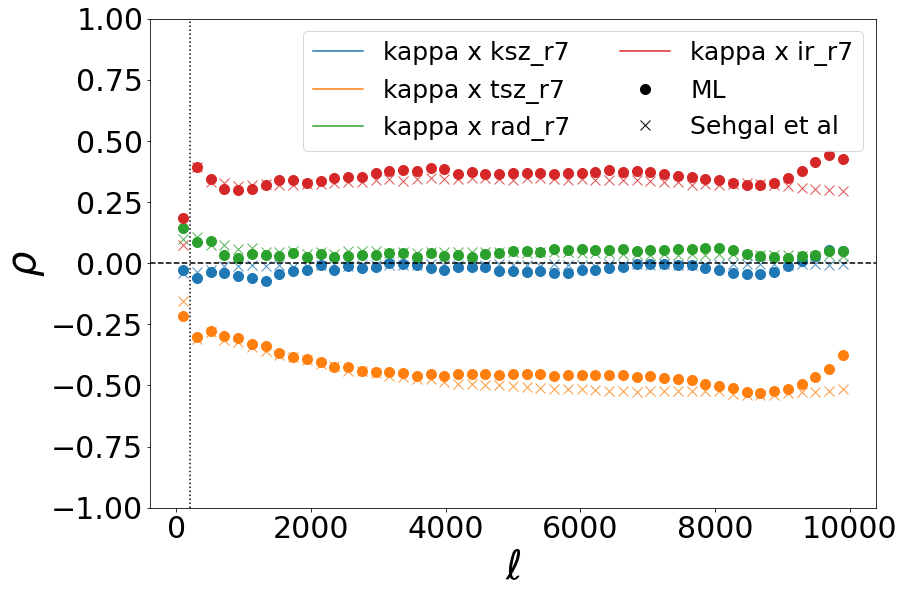

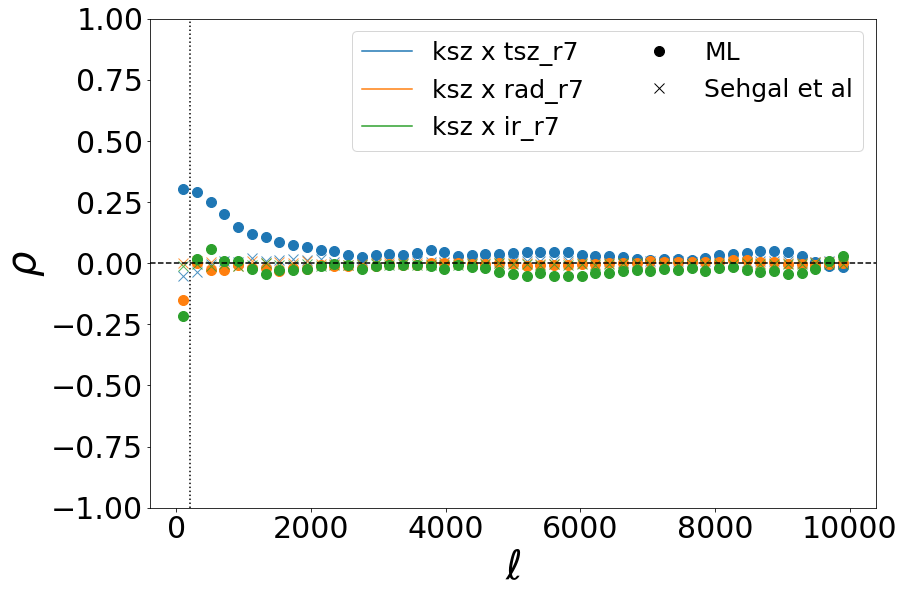

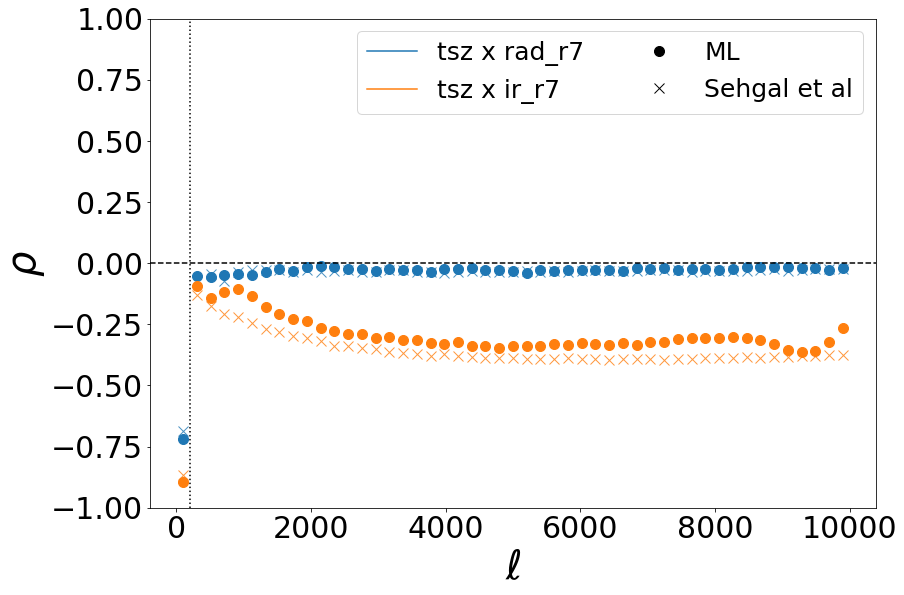

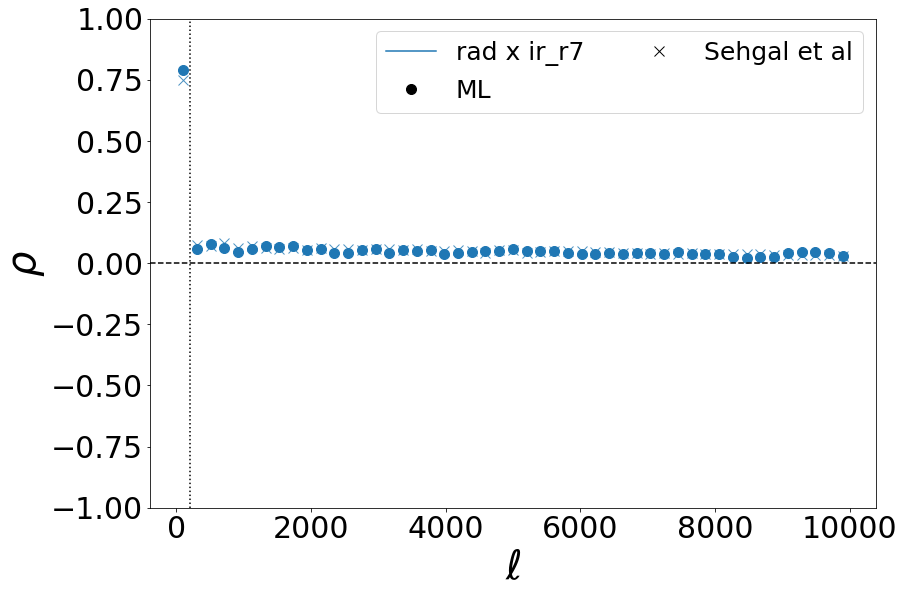

8


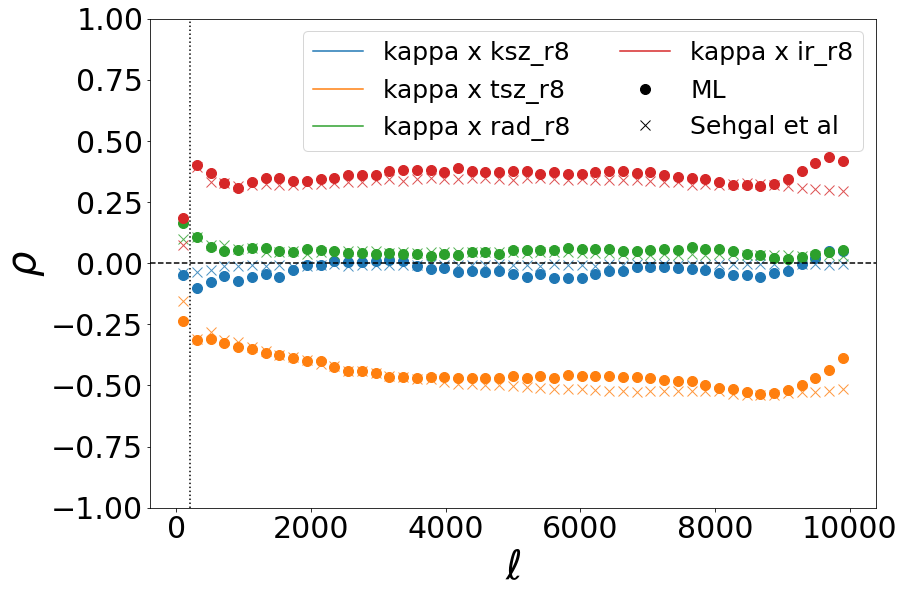

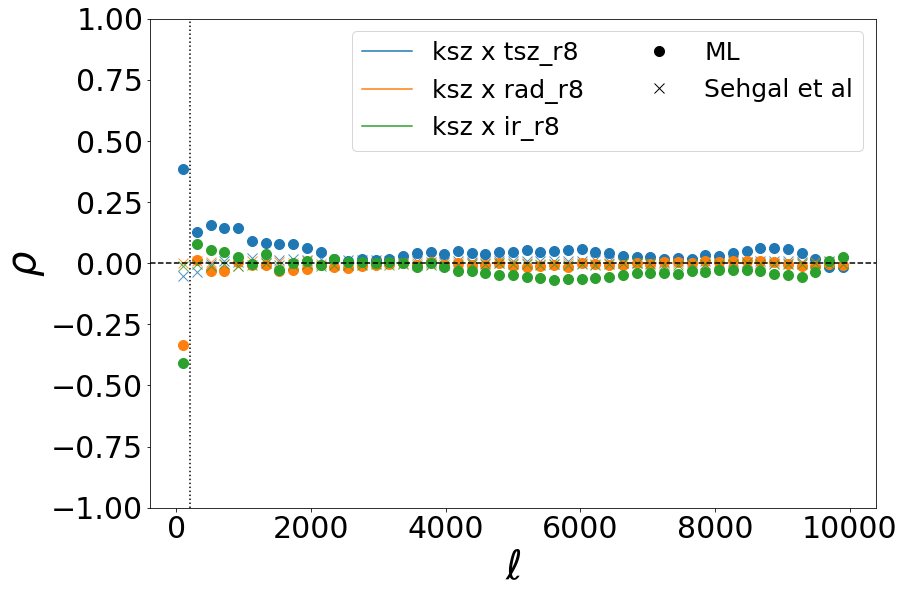

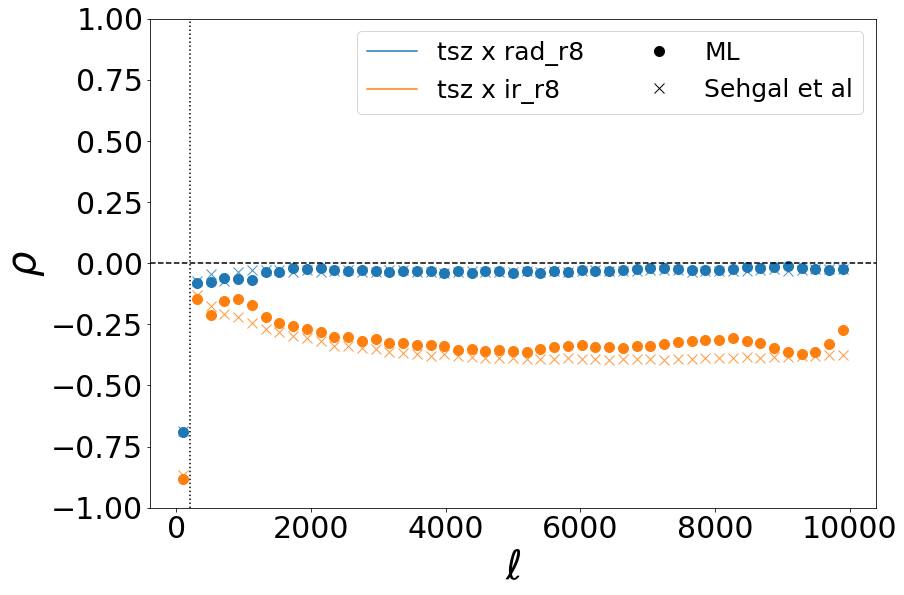

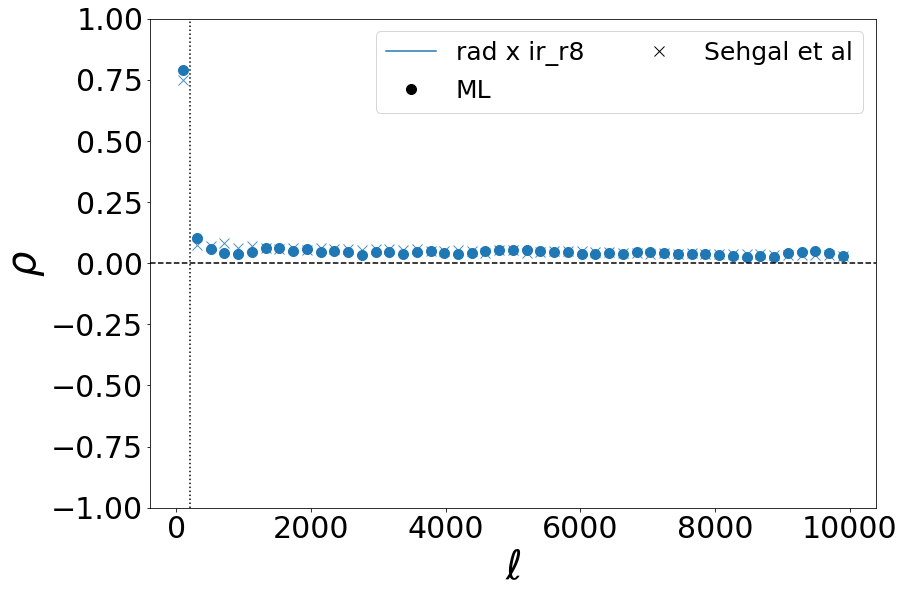

9


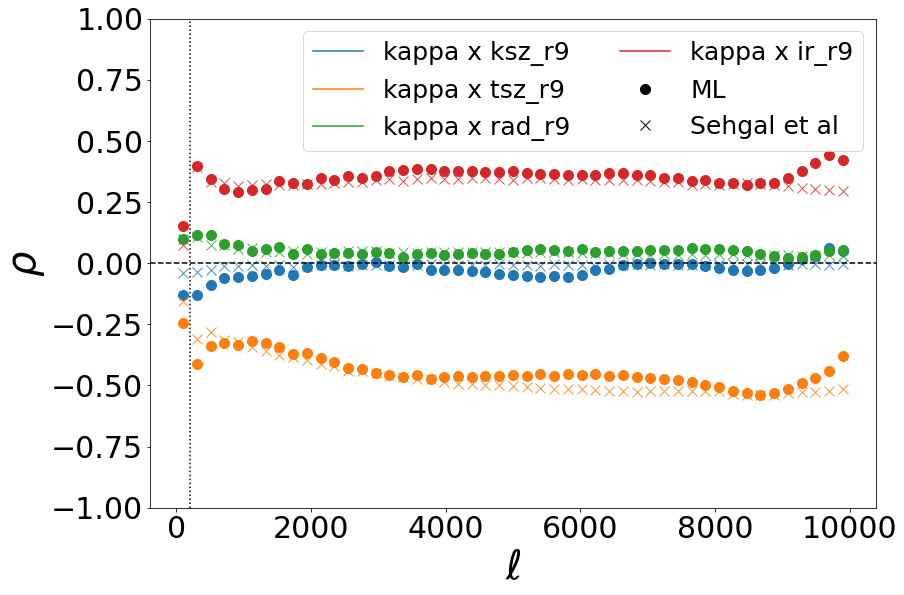

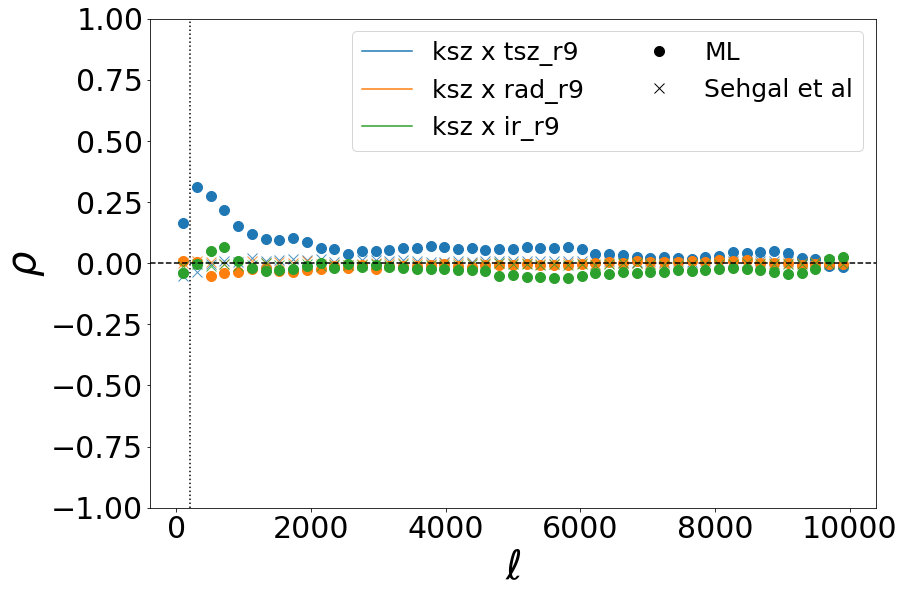

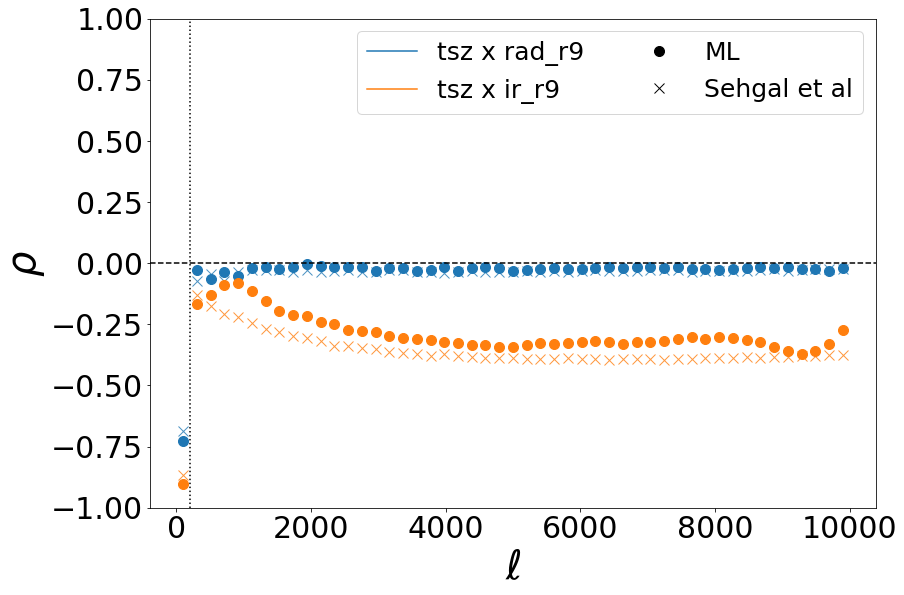

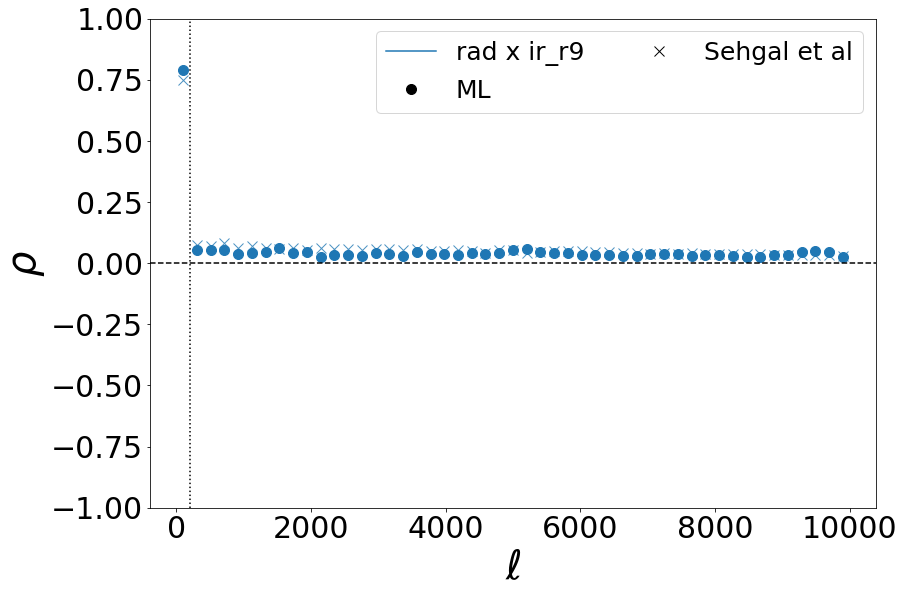

10


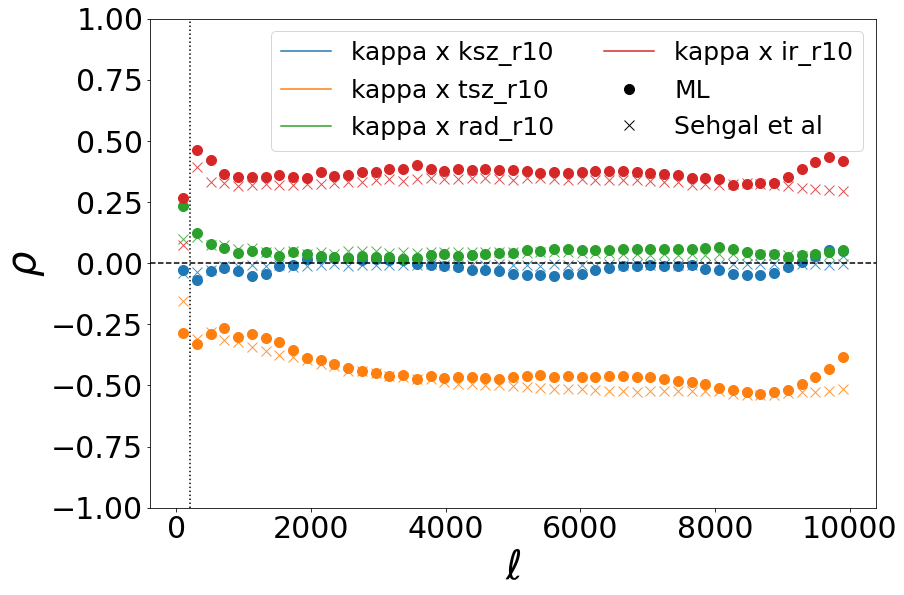

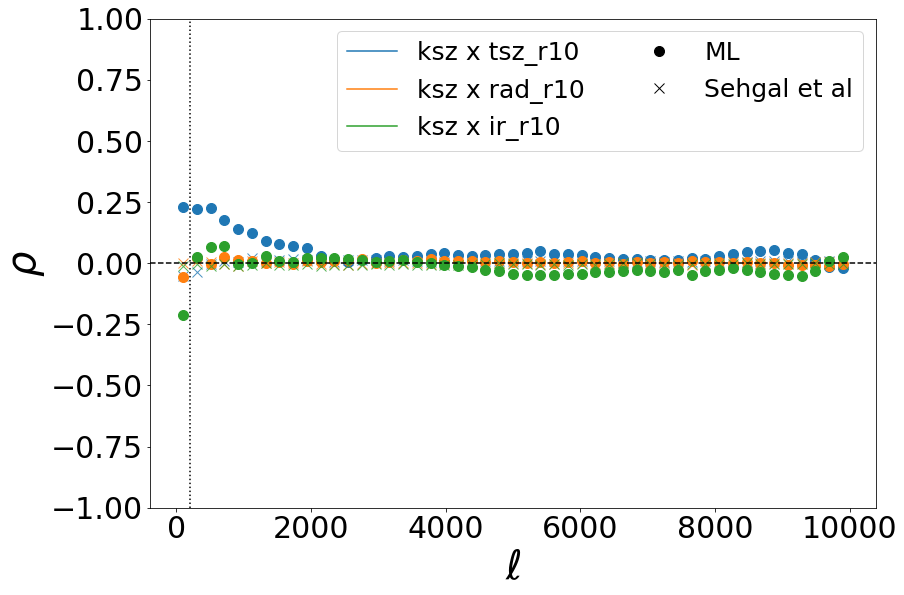

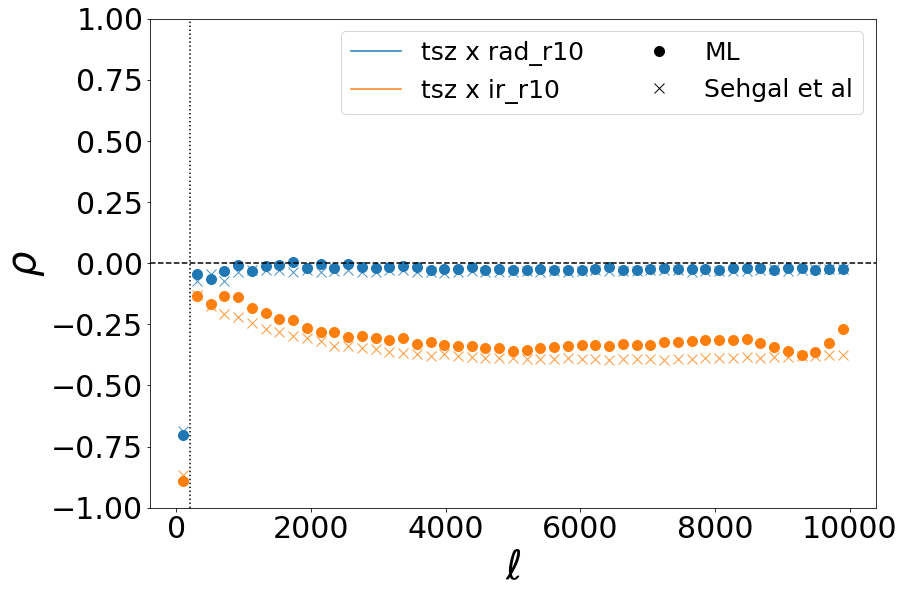

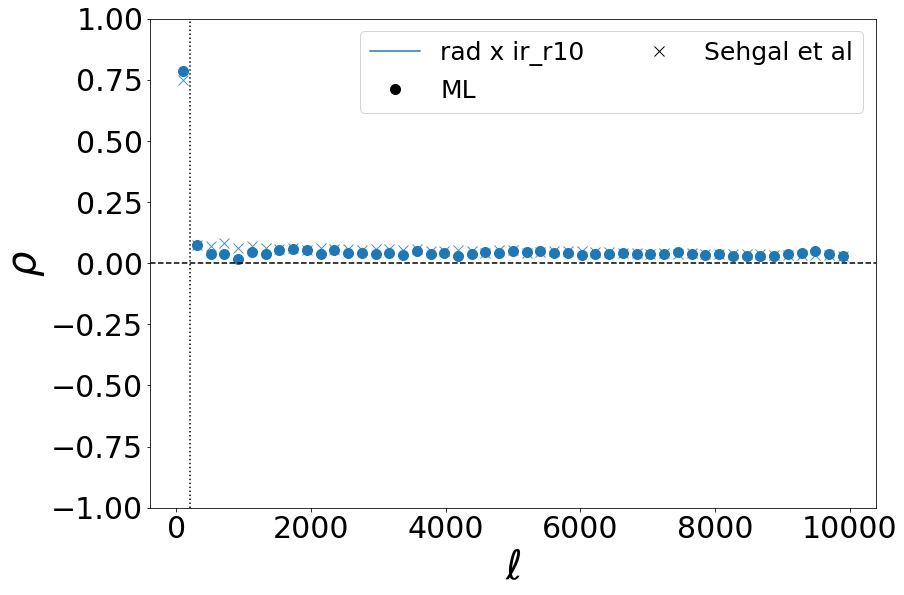

11


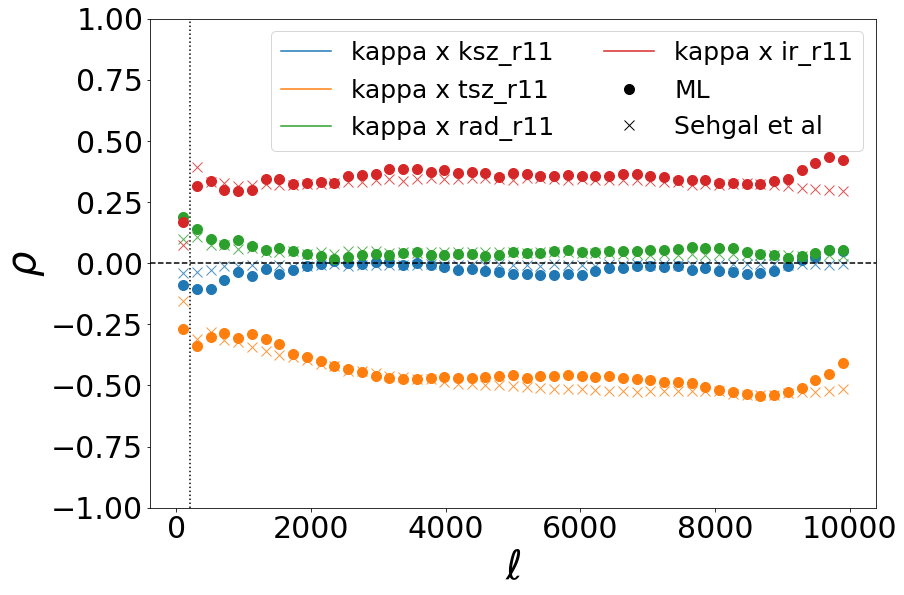

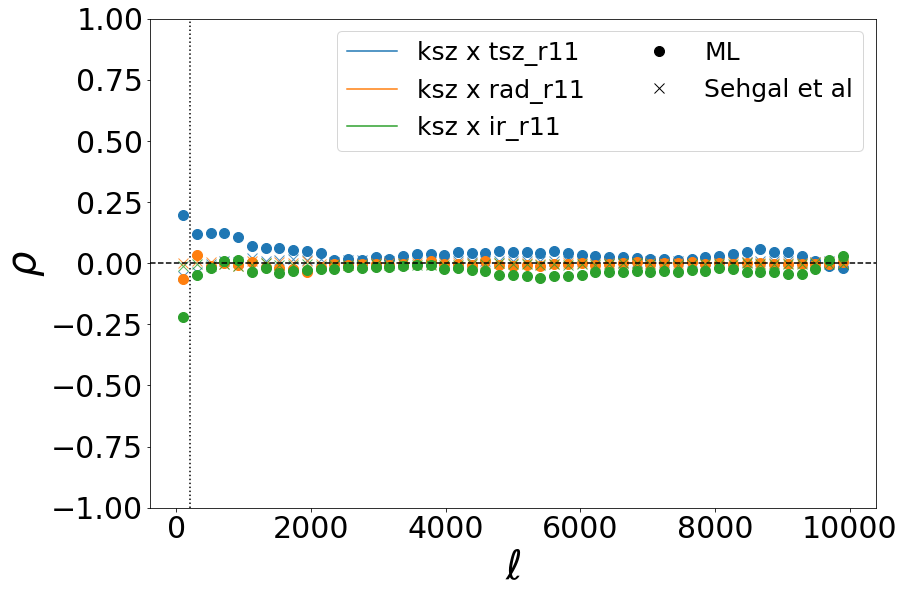

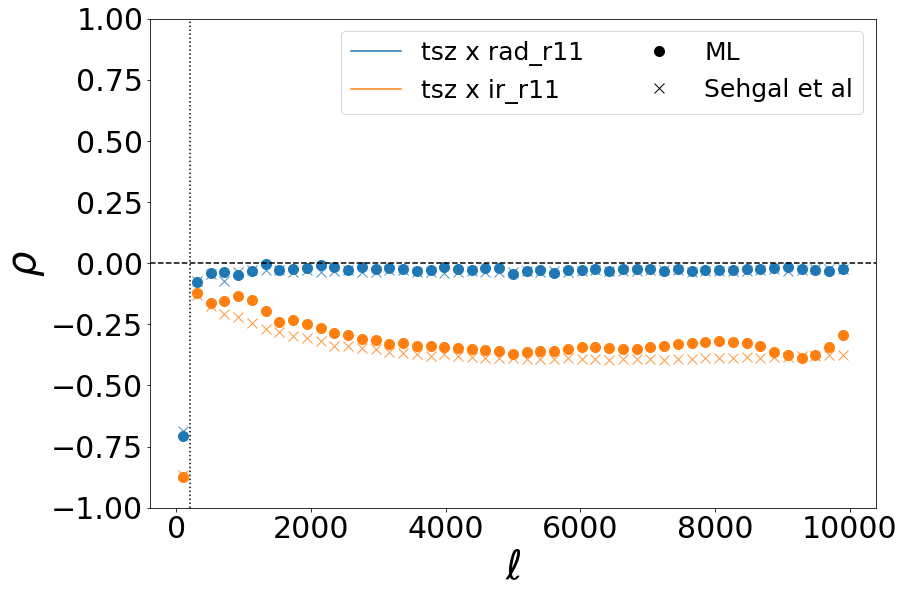

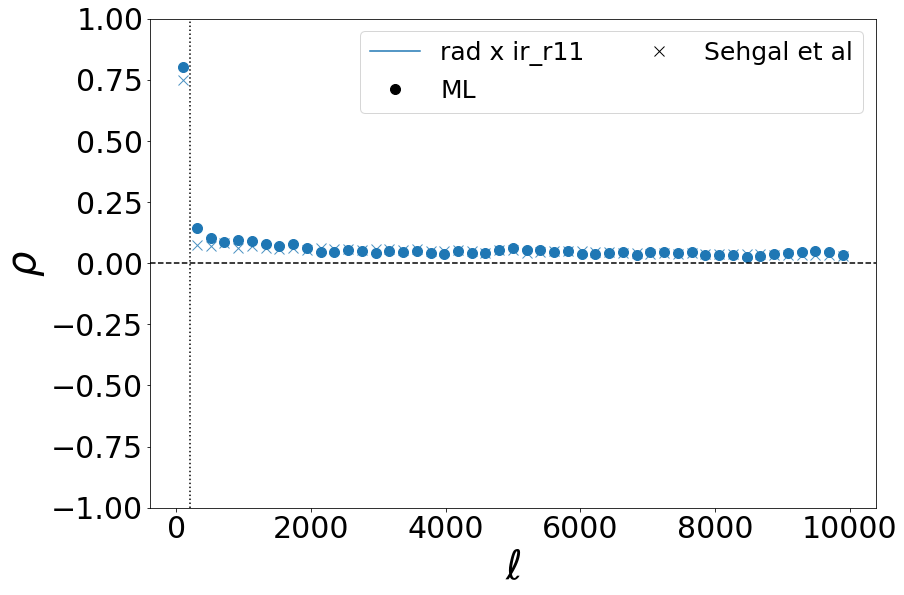

12


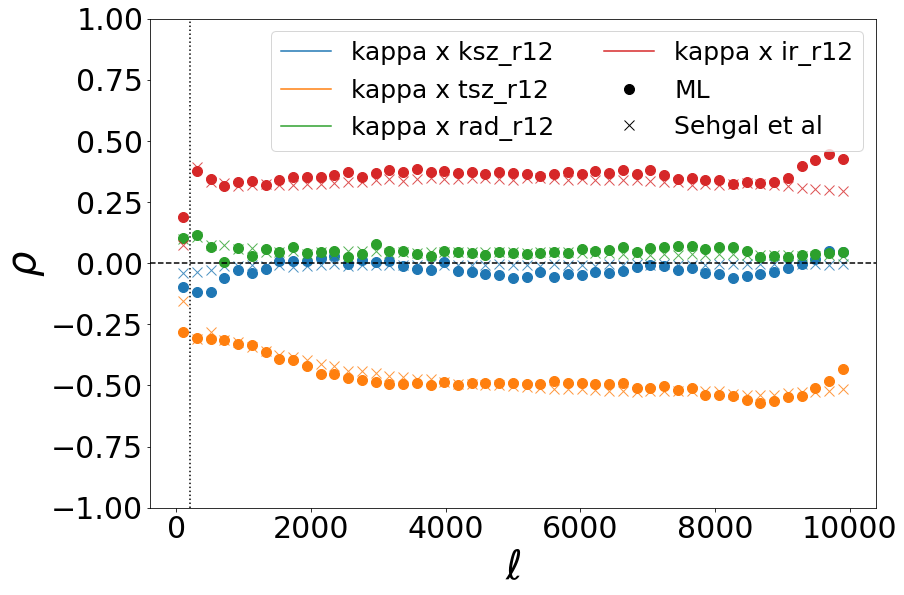

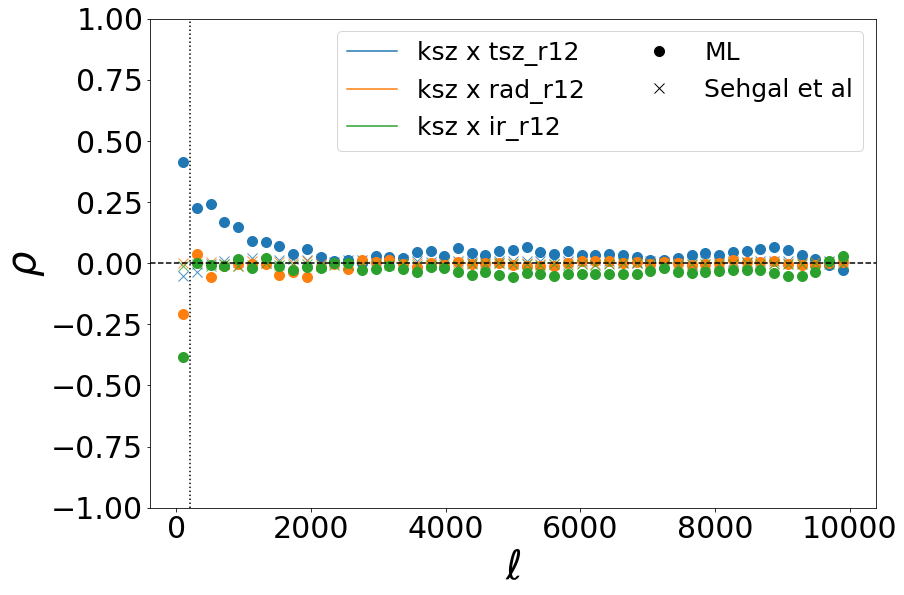

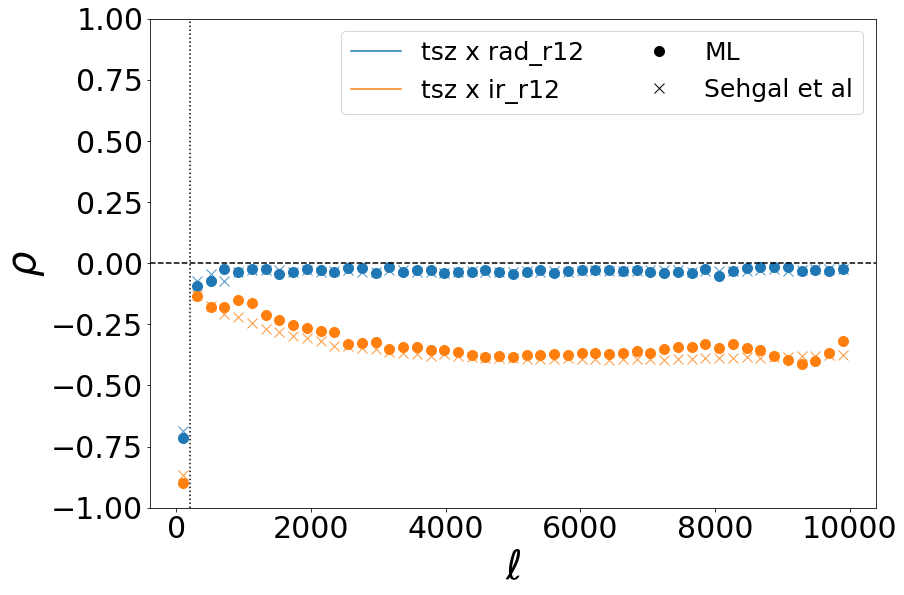

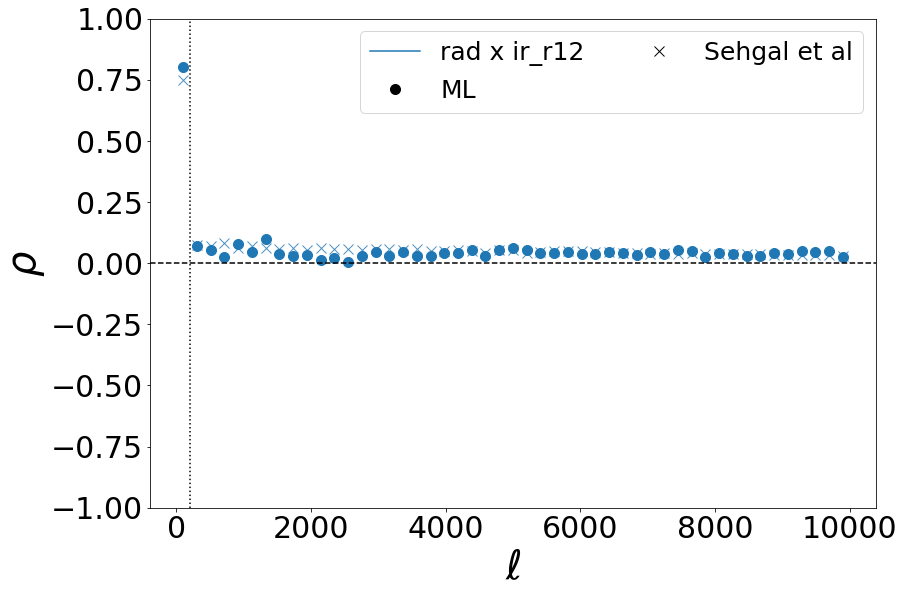

13


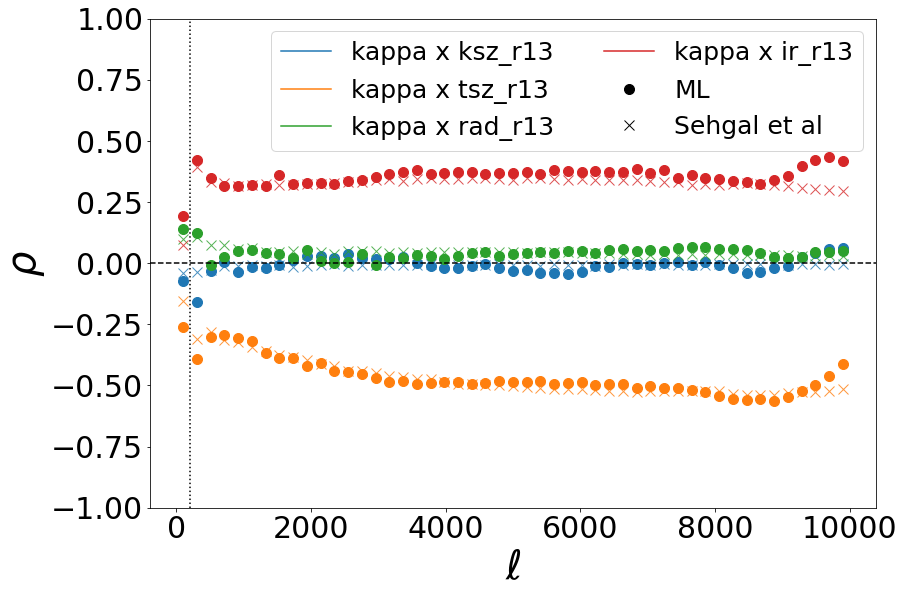

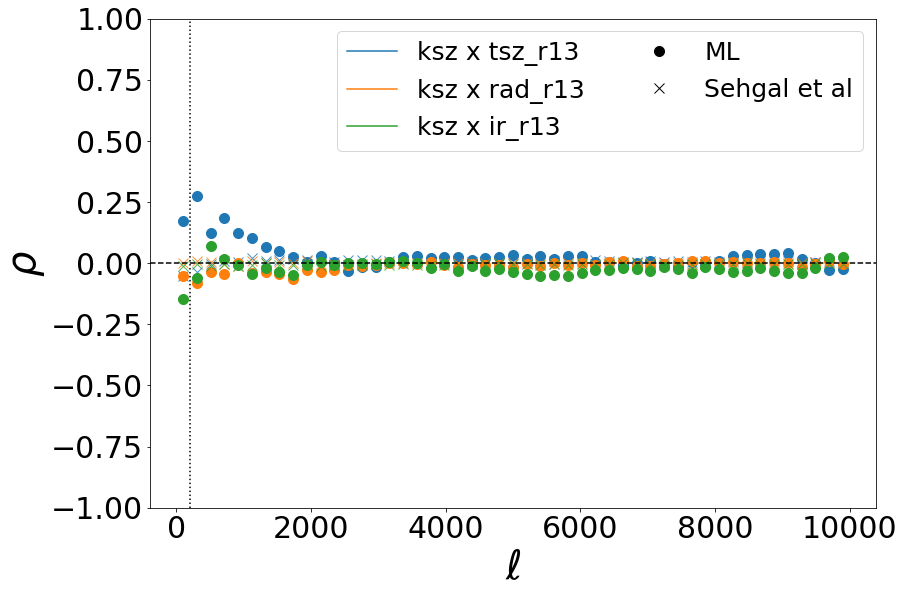

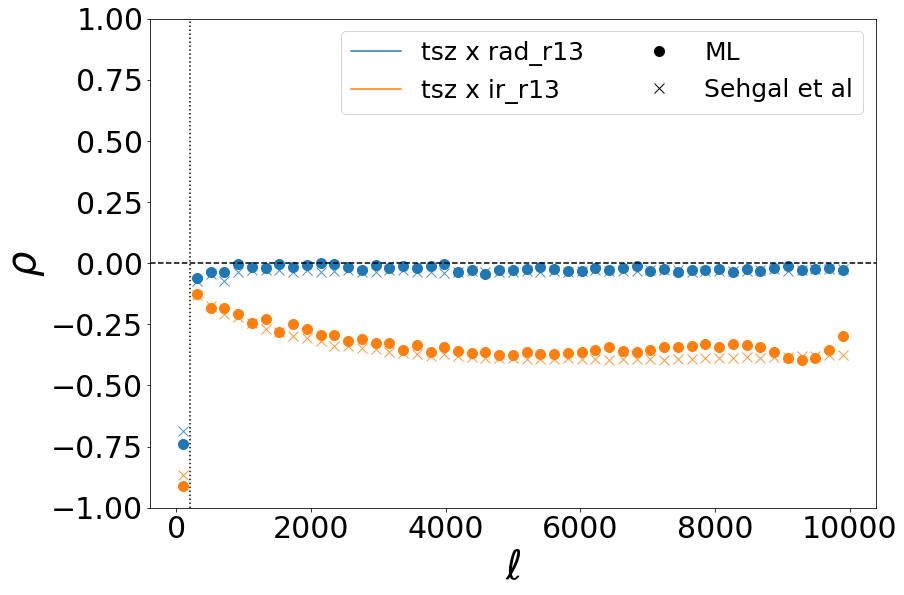

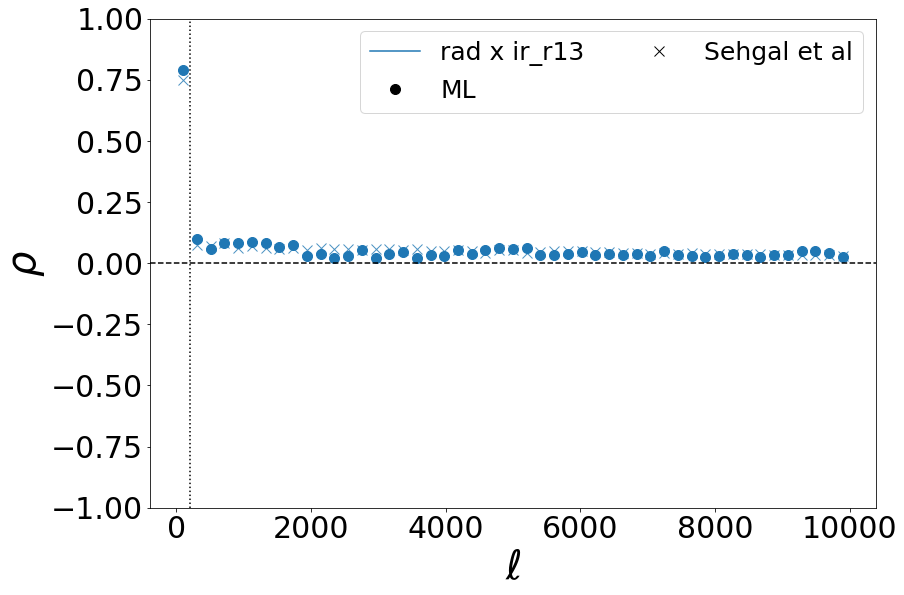

14


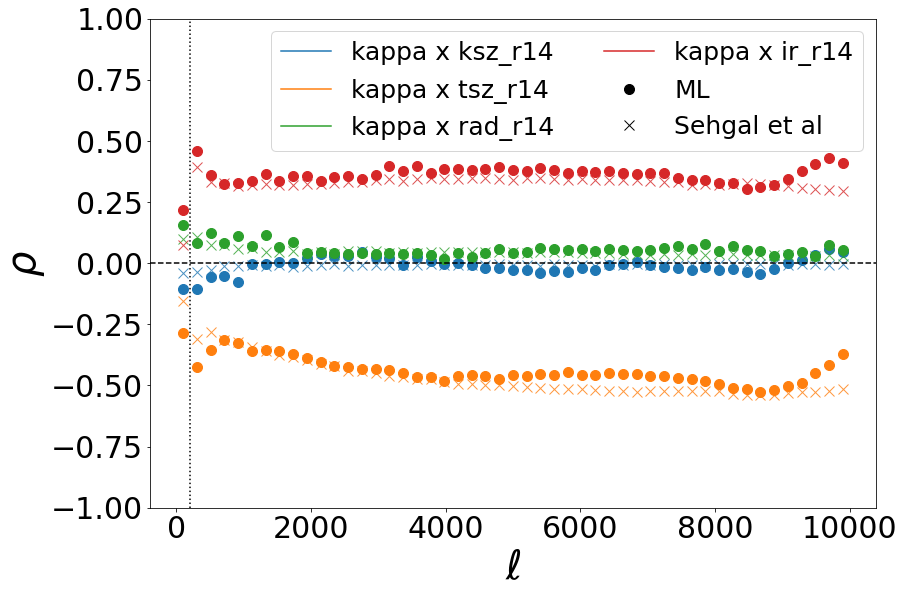

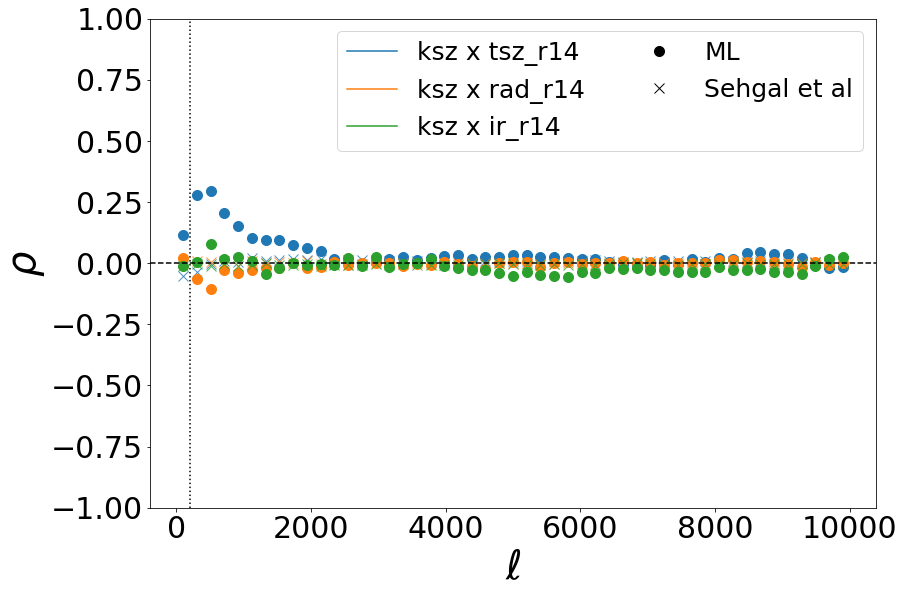

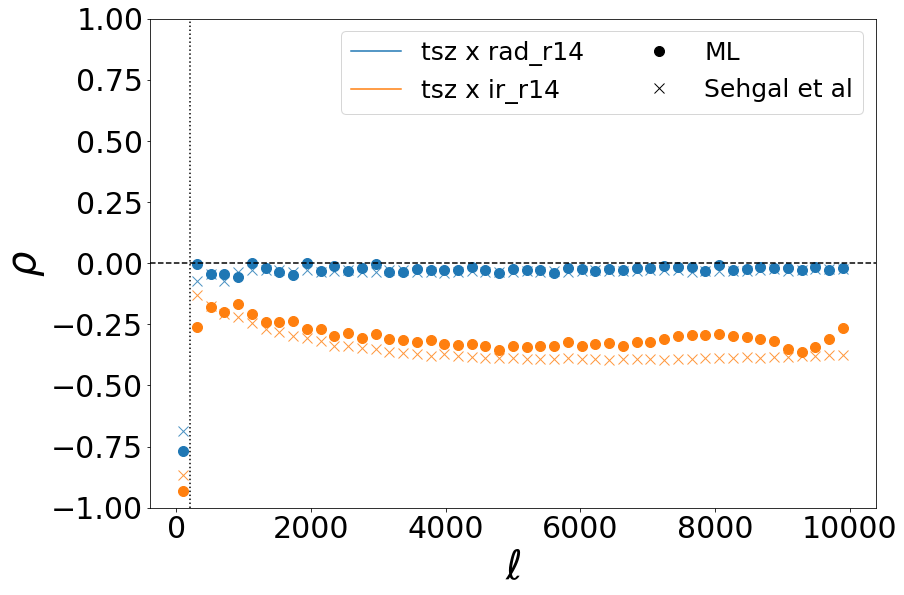

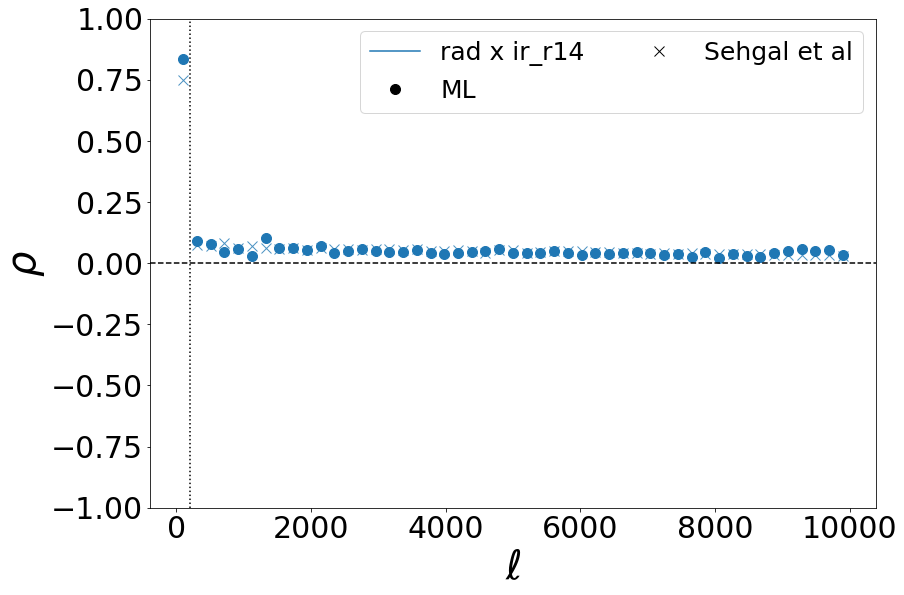

15


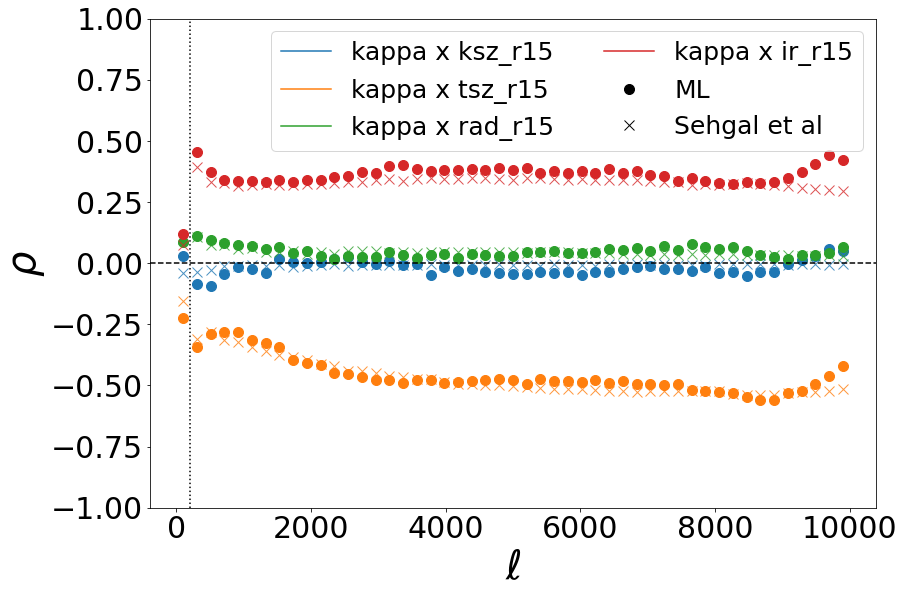

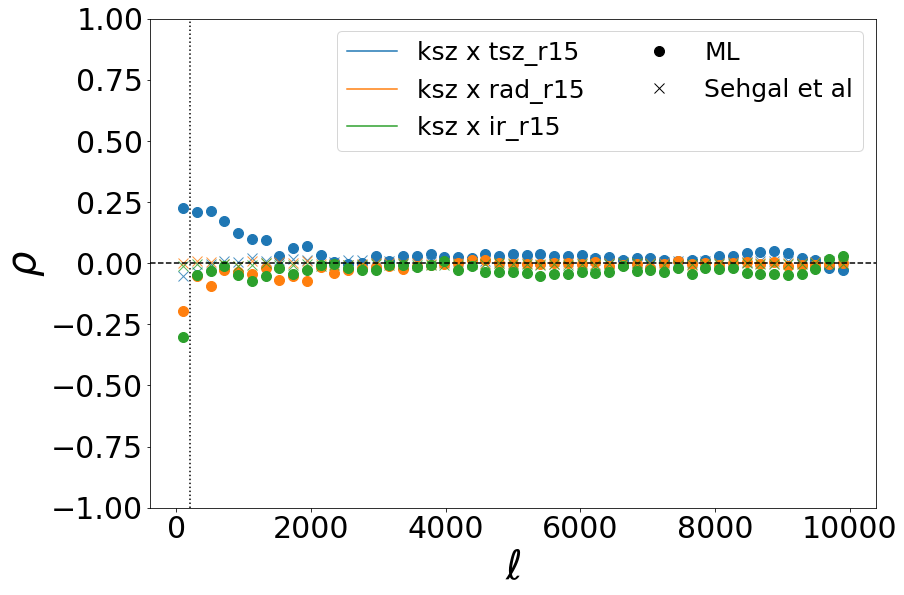

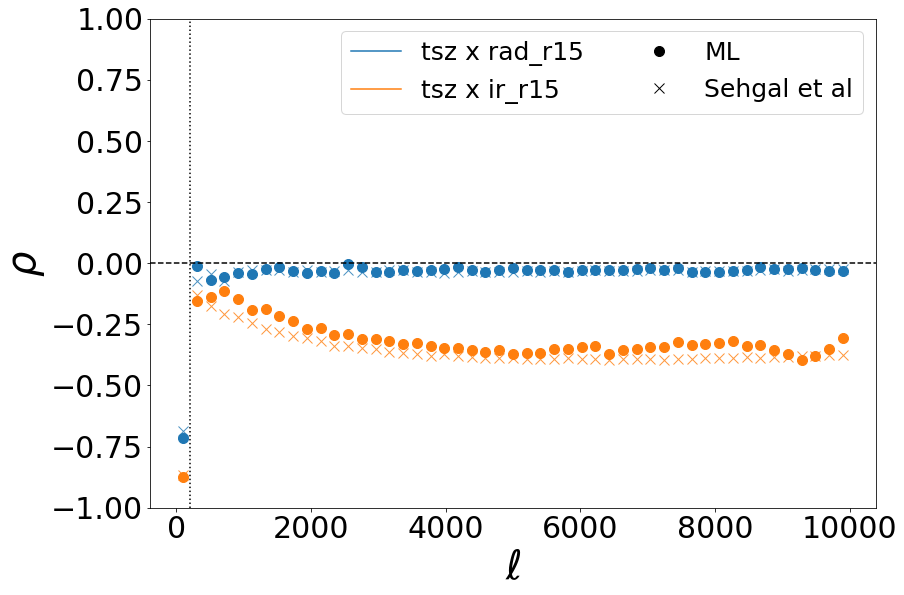

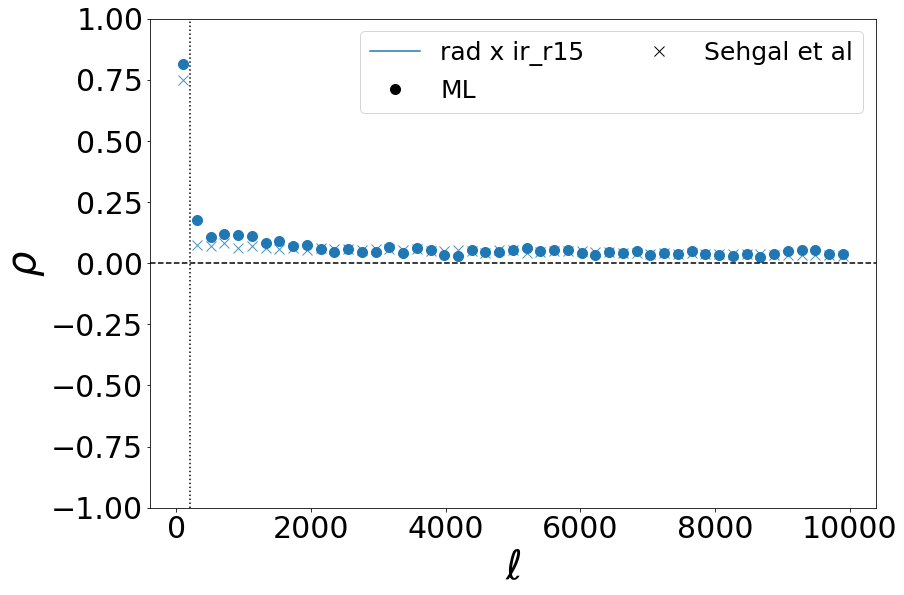

16


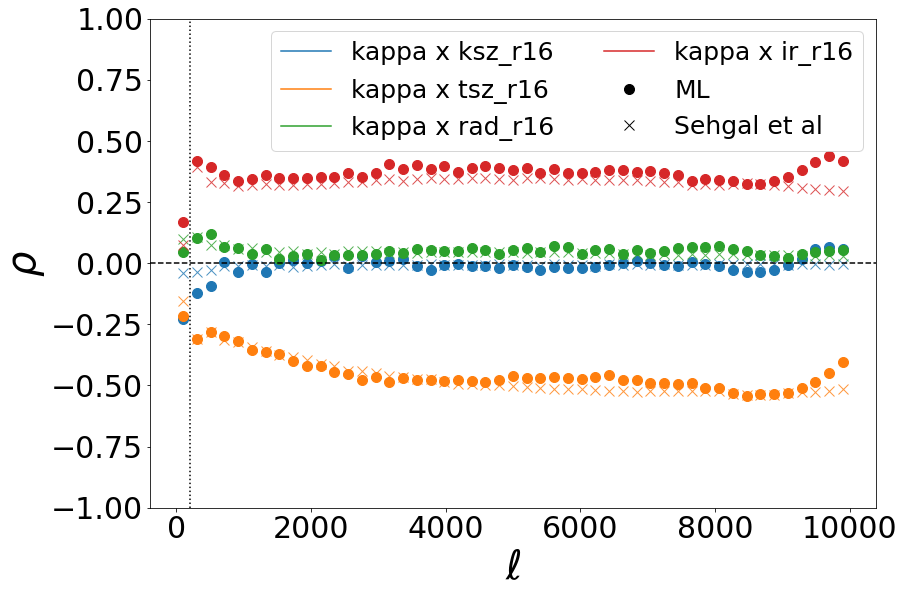

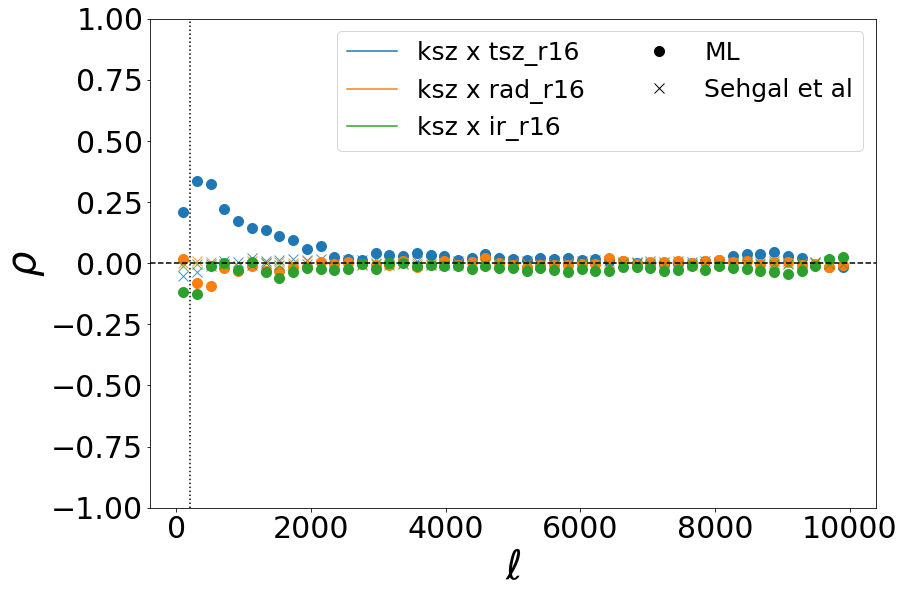

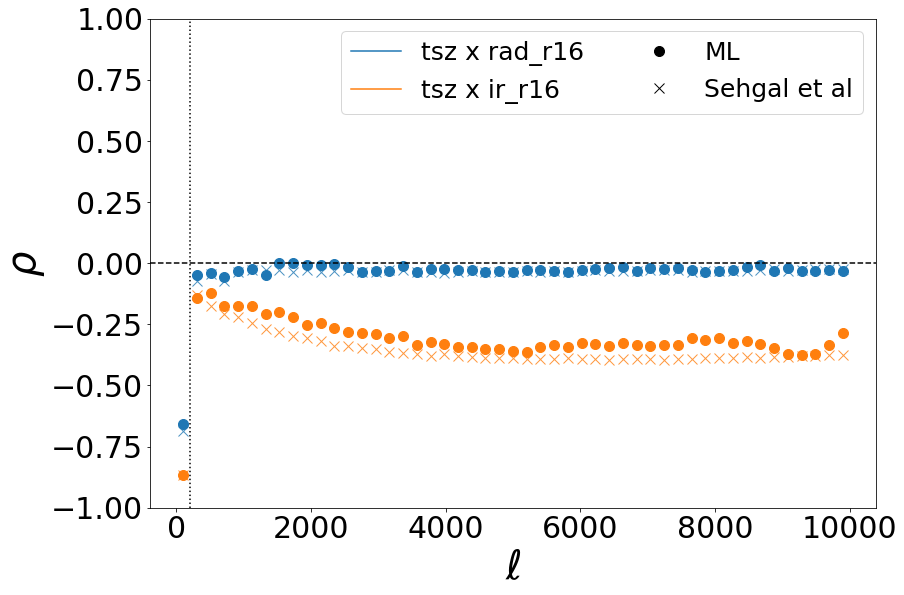

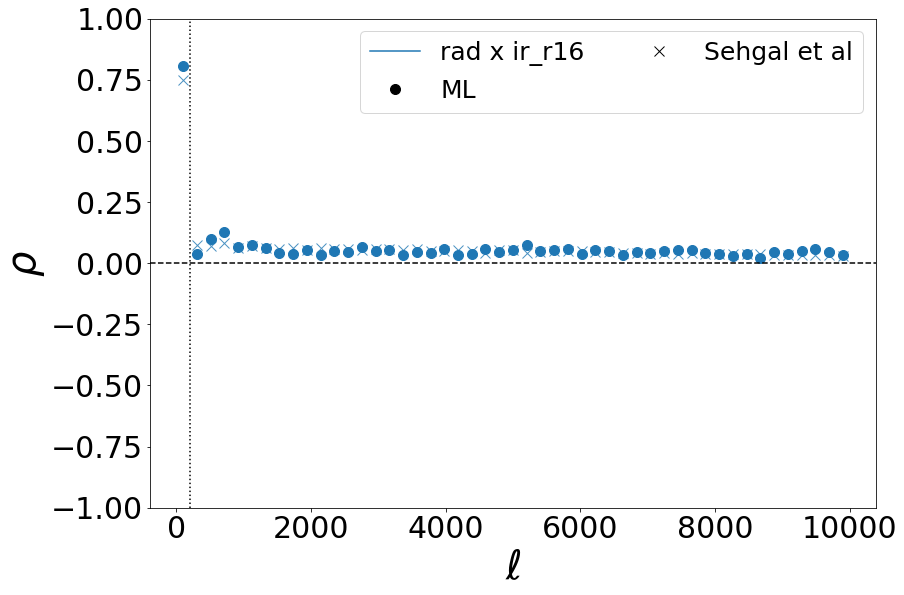

In [29]:

def get_correlation(STAT, key1, key2, postfix=""):
    key1 = compts[i]
    key2 = compts[j]
    key = [key1, key2]
    key.sort()
    key = "dls_"+"x".join(key)+postfix
    
    dls_x = STAT.stats[key]["mean"].copy()

    key = "dls_"+"x".join([key1, key1])+postfix
    dls_1 = STAT.stats[key]["mean"].copy()

    key = "dls_"+"x".join([key2, key2])+postfix
    dls_2 = STAT.stats[key]["mean"].copy()

    return dls_x/np.sqrt(dls_1*dls_2)
    

for save_point in save_points[:]:
    print(save_point)
    compts = ["kappa", "ksz", "tsz", "rad", "ir"]
    for i in range(5-1):
        fig = plt.figure(figsize=(13,9))
        ax = fig.gca()
        for j in range(i+1,5):
            key1, key2 = compts[i], compts[j]
            lbin = STAT_GEN.storage["lbin"][0]
            color = next(ax._get_lines.prop_cycler)['color']
            rho = get_correlation(STAT_TEST, key1, key2)
            plt.plot(lbin, rho, alpha=0.8,  ls="", marker="x", markersize=10, color=color)

            rho = get_correlation(STAT_GEN, key1, key2, "_r{}".format(save_point))
            plt.plot(lbin, rho, alpha=1,  ls="", marker="o", markersize=10, color=color)
            plt.plot([],[], label="{}".format(" x ".join([key1, key2])+"_r{}".format(save_point)), color=color)
        plt.plot([],[], ls="",label="ML", color="k",  marker="o", markersize=10)
        plt.plot([],[], ls="",label="Sehgal et al", color="k",  marker="x", markersize=10)

        ax.tick_params(axis='both', which='major', labelsize=30)
        ax.tick_params(axis='both', which='minor', labelsize=30)
        plt.ylabel(r"$\rho$", fontsize=40)
        plt.xlabel(r"$\ell$", fontsize=40)
        plt.ylim(-1,1)
        plt.axvline(x=200, ls=":", color="k")
        plt.axhline(y=0, ls="--", color="k")
        plt.legend(fontsize=25, loc="upper right", ncol=2)
        plt.show()
        
